In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rcParams
rcParams.update({'figure.autolayout': True})
sns.set_style("darkgrid")


def plotheatmap(drug1,drug2,percent=False):
    heatmapData = pd.DataFrame(columns=['region','count','year'])

    for YEAR in range(1999,2013):
        StaphAureuaDataPath = '/project/biocomplexity/anil/AMR/StaphAureusAntibiogramTimeSpace/RawData/StaphAureua{}.csv'.format(YEAR)
        StaphAureuaData = pd.read_csv(StaphAureuaDataPath)
        yearData = StaphAureuaData.loc[ ((StaphAureuaData[drug1] == 'R') |  (StaphAureuaData[drug1] == 'I'))
                        & ((StaphAureuaData[drug2] == 'R') |  (StaphAureuaData[drug2] == 'I'))  ]
        
        fips_value_counts = yearData['Region'].value_counts()
        df_value_counts = pd.DataFrame(fips_value_counts)
        df_value_counts = df_value_counts.reset_index()
        df_value_counts.columns = ['region', 'count']
        df_value_counts['year'] = YEAR
        if percent:
            df_value_counts['count'] = (df_value_counts['count'].div(len(StaphAureuaData)))*100
        heatmapData=heatmapData.append(df_value_counts)
    
    if not percent:  
        heatmapData['count'] = heatmapData['count'].astype(int)
    heatmapData = heatmapData.pivot("region", "year", "count")
    heatmapData.fillna(0)
    plt.figure(figsize=(10,6))
    ax = sns.heatmap(heatmapData,cmap="Spectral_r",annot=True,fmt='.2f')
    ax.set_title('{} -> {}'.format(drug1,drug2))
    if percent:
        ax.set_title('{} -> {} (% of total tests)'.format(drug1,drug2))
    fig = ax.figure
    fig.savefig('{}_{}_heatmap.png'.format(drug1,drug2).replace('/',''),dpi=300)

def plotline(drug1,drug2):
    percentData = pd.DataFrame(columns=['year','percentage'])
    for YEAR in range(1999,2013):
        StaphAureuaDataPath = '/project/biocomplexity/anil/AMR/StaphAureusAntibiogramTimeSpace/RawData/StaphAureua{}.csv'.format(YEAR)
        StaphAureuaData = pd.read_csv(StaphAureuaDataPath)
        ImipenemAmoxicillinclavulanate = StaphAureuaData.loc[ ((StaphAureuaData[drug1] == 'R') |  (StaphAureuaData[drug1] == 'I'))
                        & ((StaphAureuaData[drug2] == 'R') |  (StaphAureuaData[drug2] == 'I'))  ]
        percent=(len(ImipenemAmoxicillinclavulanate)/len(StaphAureuaData))*100
        df2 = {'year': YEAR, 'percentage': percent}
        percentData = percentData.append(df2, ignore_index = True)
    plt = sns.lineplot(data=percentData,x='year',y='percentage')
    plt.set_title('{} -> {}'.format(drug1,drug2))
    fig = plt.figure
    fig.savefig('{}_{}_lineplot.png'.format(drug1,drug2).replace('/',''),dpi=300)

In [3]:
def plotlineRegion(drug1,drug2,region):
    percentData = pd.DataFrame(columns=['year','percentage'])
    for YEAR in range(1999,2013):
        StaphAureuaDataPath = 'splitData/{}{}.csv'.format(region,YEAR)
        
        try:
            StaphAureuaData = pd.read_csv(StaphAureuaDataPath)
        except OSError as e:
            df2 = {'year': YEAR, 'percentage': 0}
            percentData = percentData.append(df2, ignore_index = True)
            continue
        
        ruleData = StaphAureuaData.loc[ ( (StaphAureuaData[drug1] == 'R') | (StaphAureuaData[drug1] == 'I') ) & ((StaphAureuaData[drug2] == 'R') | (StaphAureuaData[drug2] == 'I'))]
        percent=(len(ruleData)/len(StaphAureuaData))*100
        df2 = {'year': YEAR, 'percentage': percent}
        percentData = percentData.append(df2, ignore_index = True)
    print(percentData)
    plt = sns.lineplot(data=percentData,x='year',y='percentage')
    plt.set_title('{} {} -> {}'.format(region,drug1,drug2))
    fig = plt.figure
    fig.savefig('plot_permute/{}_{}_{}_lineplot.png'.format(region,drug1.replace('/',''),drug2.replace('/','')),dpi=300)

      year percentage
0     1999          0
1     2000          0
2     2001          0
3     2002          0
4     2003          0
5     2004          0
6   2005.0  65.909091
7   2006.0  60.131796
8   2007.0  60.743134
9   2008.0  56.632653
10  2009.0  52.504039
11  2010.0  48.165138
12  2011.0   52.21519
13  2012.0  48.534202


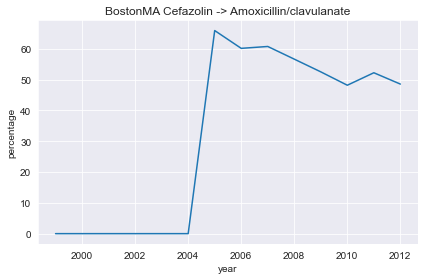

In [18]:
plotlineRegion('Cefazolin','Amoxicillin/clavulanate','BostonMA')

In [2]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

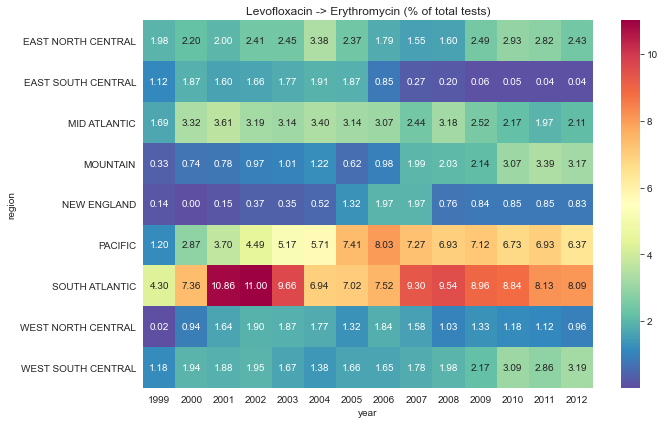

In [4]:
plotheatmap('Levofloxacin','Erythromycin',True)

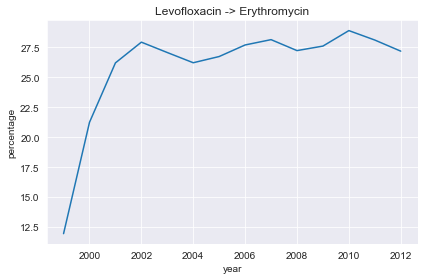

In [5]:
plotline('Levofloxacin','Erythromycin')

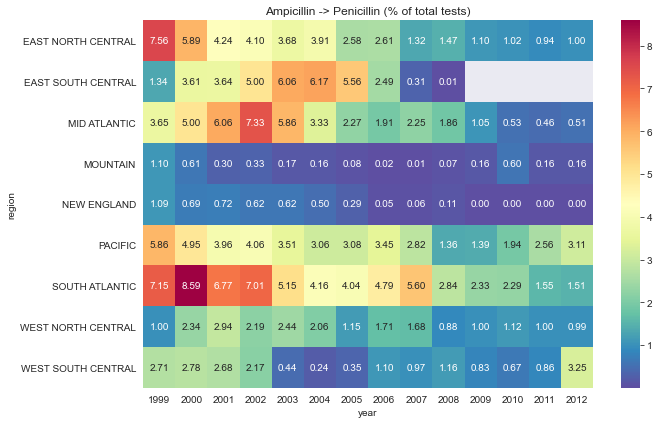

In [6]:
plotheatmap('Ampicillin','Penicillin',True)

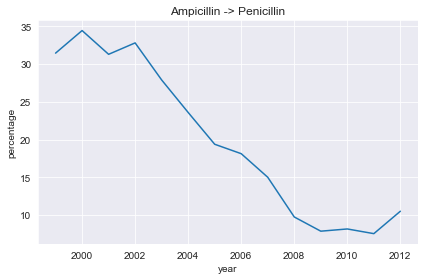

In [7]:
plotline('Ampicillin','Penicillin')

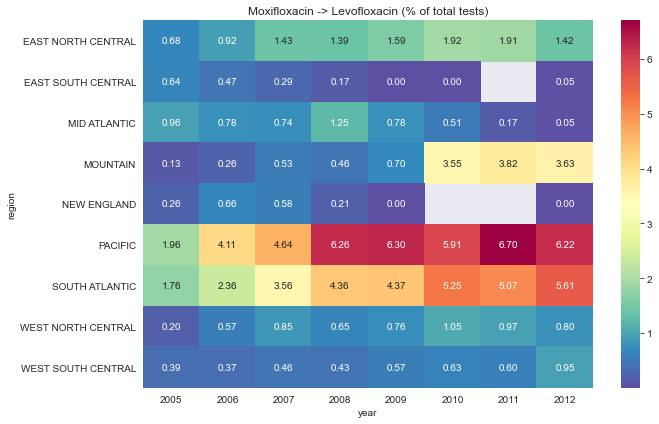

In [73]:
plotheatmap( 'Moxifloxacin' , 'Levofloxacin' , True )

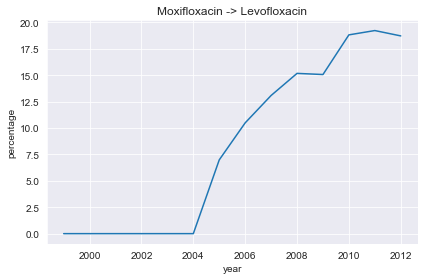

In [75]:
plotline( 'Moxifloxacin' , 'Levofloxacin')

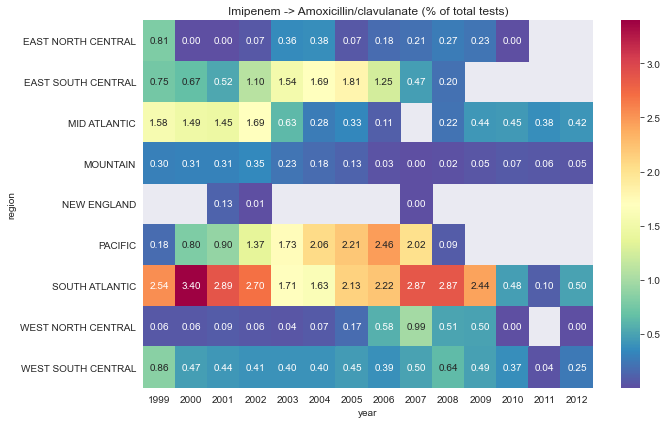

In [35]:
plotheatmap('Imipenem', 'Amoxicillin/clavulanate',True)

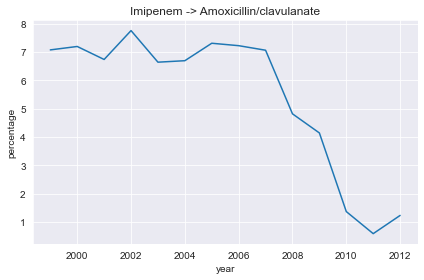

In [29]:
plotline('Imipenem', 'Amoxicillin/clavulanate')

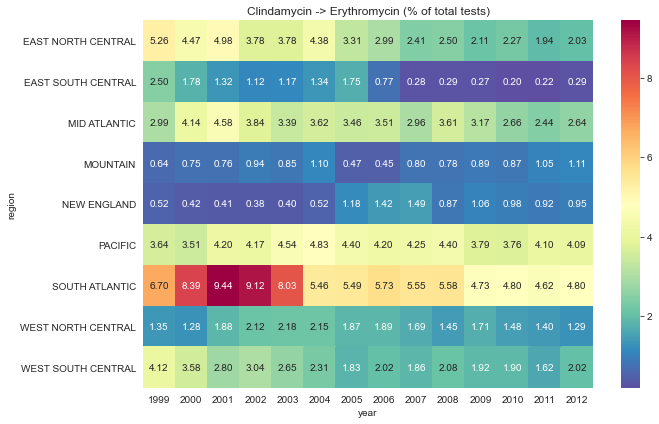

In [50]:
plotheatmap('Clindamycin', 'Erythromycin',True)

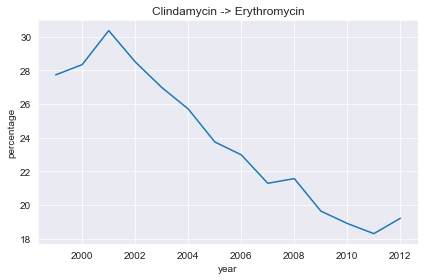

In [51]:
plotline('Clindamycin', 'Erythromycin')

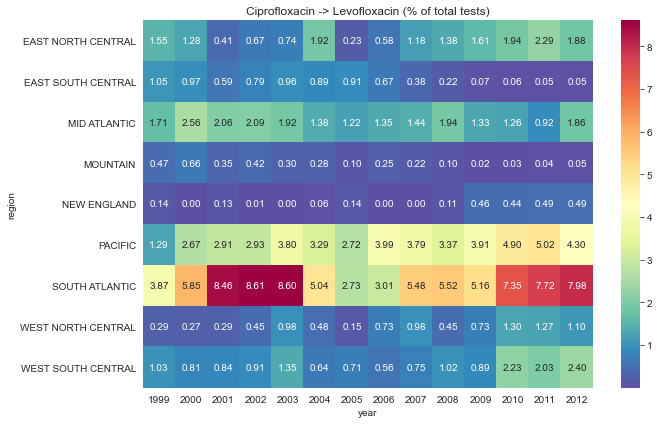

In [52]:
plotheatmap('Ciprofloxacin','Levofloxacin',True)

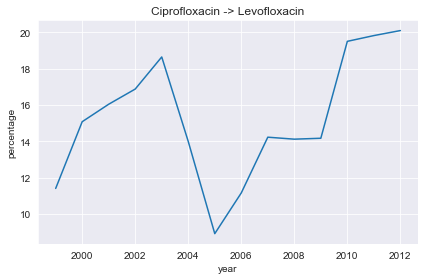

In [53]:
plotline('Ciprofloxacin','Levofloxacin')

In [59]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rcParams
rcParams.update({'figure.autolayout': True})
sns.set_style("darkgrid")

def plotheatmap(drug1,drug2,drug3,percent=False):
    heatmapData = pd.DataFrame(columns=['region','count','year'])

    for YEAR in range(1999,2013):
        StaphAureuaDataPath = '/project/biocomplexity/anil/AMR/StaphAureusAntibiogramTimeSpace/RawData/StaphAureua{}.csv'.format(YEAR)
        StaphAureuaData = pd.read_csv(StaphAureuaDataPath)
        yearData = StaphAureuaData.loc[ ((StaphAureuaData[drug1] == 'R') |  (StaphAureuaData[drug1] == 'I'))
                        & ((StaphAureuaData[drug2] == 'R') |  (StaphAureuaData[drug2] == 'I'))
                        & ((StaphAureuaData[drug3] == 'R') |  (StaphAureuaData[drug3] == 'I'))]
        
        fips_value_counts = yearData['Region'].value_counts()
        df_value_counts = pd.DataFrame(fips_value_counts)
        df_value_counts = df_value_counts.reset_index()
        df_value_counts.columns = ['region', 'count']
        df_value_counts['year'] = YEAR
        if percent:
            df_value_counts['count'] = (df_value_counts['count'].div(len(StaphAureuaData)))*100
        heatmapData=heatmapData.append(df_value_counts)
        
    if not percent:  
        heatmapData['count'] = heatmapData['count'].astype(int)

    heatmapData = heatmapData.pivot("region", "year", "count")
    heatmapData.fillna(0)
    plt.figure(figsize=(10,6))
    ax = sns.heatmap(heatmapData,cmap="Spectral_r",annot=True,fmt='.2f')
    ax.set_title('{} & {} -> {}'.format(drug1,drug2,drug3))
    if percent:
        ax.set_title('{} & {} -> {} (% of total tests)'.format(drug1,drug2,drug3))
    fig = ax.figure
    fig.savefig('{}_{}_heatmap.png'.format(drug1,drug2).replace('/',''),dpi=300)

def plotline(drug1,drug2,drug3):
    percentData = pd.DataFrame(columns=['year','percentage'])
    for YEAR in range(1999,2013):
        StaphAureuaDataPath = '/project/biocomplexity/anil/AMR/StaphAureusAntibiogramTimeSpace/RawData/StaphAureua{}.csv'.format(YEAR)
        StaphAureuaData = pd.read_csv(StaphAureuaDataPath)
        ImipenemAmoxicillinclavulanate = StaphAureuaData.loc[ ((StaphAureuaData[drug1] == 'R') |  (StaphAureuaData[drug1] == 'I'))
                        & ((StaphAureuaData[drug2] == 'R') |  (StaphAureuaData[drug2] == 'I')) 
                        & ((StaphAureuaData[drug3] == 'R') |  (StaphAureuaData[drug3] == 'I')) ]
        percent=(len(ImipenemAmoxicillinclavulanate)/len(StaphAureuaData))*100
        df2 = {'year': YEAR, 'percentage': percent}
        percentData = percentData.append(df2, ignore_index = True)
    plt = sns.lineplot(data=percentData,x='year',y='percentage')
    plt.set_title('{} & {} -> {}'.format(drug1,drug2,drug3))
    fig = plt.figure
    fig.savefig('{}_{}_{}_lineplot.png'.format(drug1,drug2,drug3).replace('/',''),dpi=300)
    

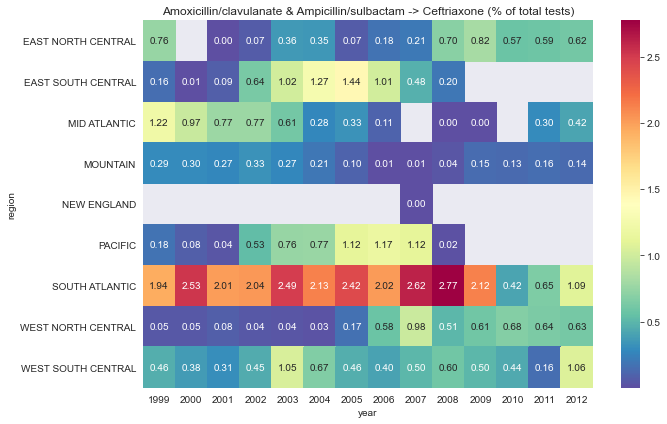

In [60]:
plotheatmap('Amoxicillin/clavulanate', 'Ampicillin/sulbactam' , 'Ceftriaxone' , True)

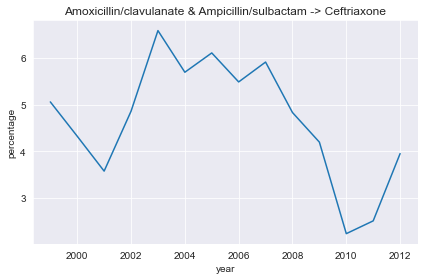

In [61]:
plotline('Amoxicillin/clavulanate', 'Ampicillin/sulbactam' , 'Ceftriaxone')

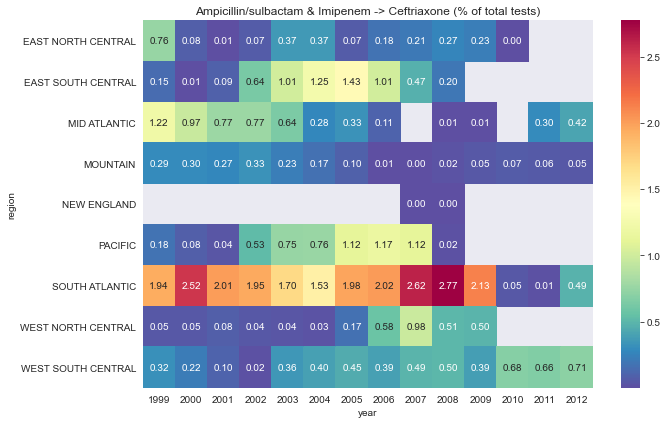

In [62]:
plotheatmap('Ampicillin/sulbactam', 'Imipenem' , 'Ceftriaxone', True)


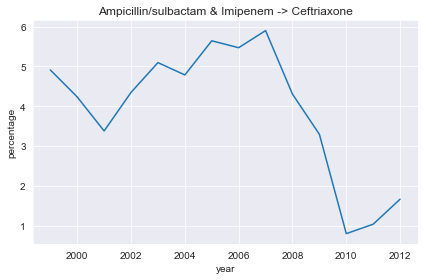

In [64]:
plotline('Ampicillin/sulbactam', 'Imipenem' , 'Ceftriaxone')


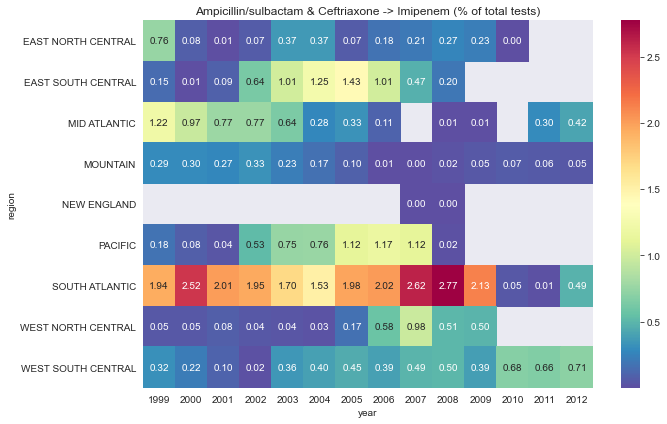

In [65]:
plotheatmap('Ampicillin/sulbactam', 'Ceftriaxone' , 'Imipenem',True)


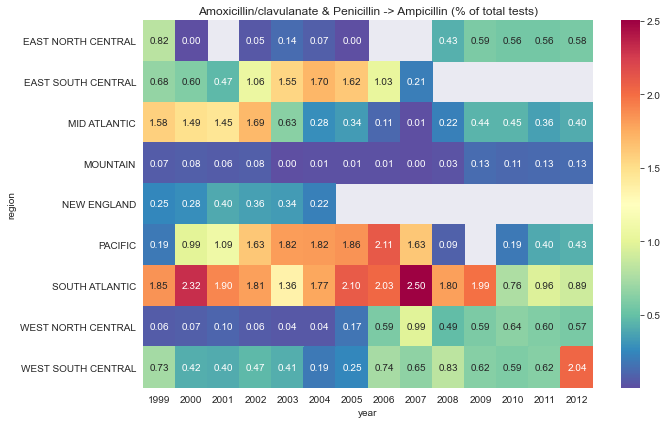

In [66]:
plotheatmap('Amoxicillin/clavulanate','Penicillin','Ampicillin',True)

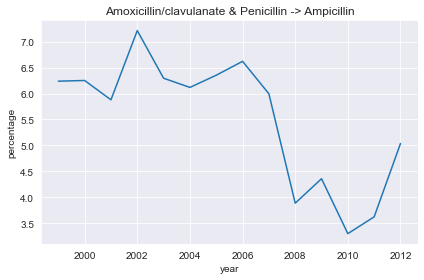

In [68]:
plotline('Amoxicillin/clavulanate','Penicillin','Ampicillin')

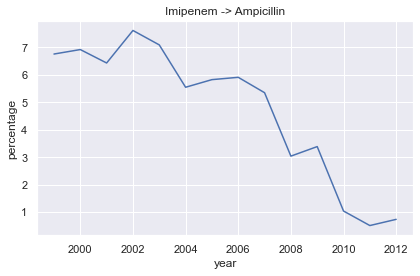

In [166]:
plotline( 'Imipenem' , 'Ampicillin' )

In [8]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rcParams
rcParams.update({'figure.autolayout': True})

def plotheatmapR(drug1):
    heatmapData = pd.DataFrame(columns=['region','count','year'])

    for YEAR in range(1999,2013):
        StaphAureuaDataPath = '/project/biocomplexity/anil/AMR/StaphAureusAntibiogramTimeSpace/RawData/StaphAureua{}.csv'.format(YEAR)
        StaphAureuaData = pd.read_csv(StaphAureuaDataPath)
        yearData = StaphAureuaData.loc[ ((StaphAureuaData[drug1] == 'R') |  (StaphAureuaData[drug1] == 'I'))  ]
        fips_value_counts = yearData['Region'].value_counts()
        df_value_counts = pd.DataFrame(fips_value_counts)
        df_value_counts = df_value_counts.reset_index()
        df_value_counts.columns = ['region', 'count']
        df_value_counts['count'] = (df_value_counts['count'].div(len(StaphAureuaData)))*100
        df_value_counts['year'] = YEAR
        heatmapData=heatmapData.append(df_value_counts)
        
    
    #heatmapData['count'] = heatmapData['count'].astype(int)
    heatmapData = heatmapData.pivot("region", "year", "count")
    heatmapData.fillna(0)
    plt.figure(figsize=(10,6))
    ax = sns.heatmap(heatmapData,cmap="Spectral_r",annot=True,fmt='.2f')
    ax.set_title('{} Resistant (% of total tests)'.format(drug1))
    fig = ax.figure
    fig.savefig('{}_resistant_heat.png'.format(drug1).replace('/',''),dpi=300)

def plotlineR(drug1):
    percentData = pd.DataFrame(columns=['year','percentage'])
    for YEAR in range(1999,2013):
        StaphAureuaDataPath = '/project/biocomplexity/anil/AMR/StaphAureusAntibiogramTimeSpace/RawData/StaphAureua{}.csv'.format(YEAR)
        StaphAureuaData = pd.read_csv(StaphAureuaDataPath)
        ImipenemAmoxicillinclavulanate = StaphAureuaData.loc[ ((StaphAureuaData[drug1] == 'R') |  (StaphAureuaData[drug1] == 'I'))  ]
        percent=(len(ImipenemAmoxicillinclavulanate)/len(StaphAureuaData))*100
        df2 = {'year': YEAR, 'percentage': percent}
        percentData = percentData.append(df2, ignore_index = True)
    plt = sns.lineplot(data=percentData,x='year',y='percentage')
    plt.set_title('{} Resistance (% of total tests)'.format(drug1))
    fig = plt.figure
    fig.savefig('{}_r_lineplot.png'.format(drug1).replace('/',''),dpi=300)

def plotheatmapS(drug1):
    heatmapData = pd.DataFrame(columns=['region','count','year'])

    for YEAR in range(1999,2013):
        StaphAureuaDataPath = '/project/biocomplexity/anil/AMR/StaphAureusAntibiogramTimeSpace/RawData/StaphAureua{}.csv'.format(YEAR)
        StaphAureuaData = pd.read_csv(StaphAureuaDataPath)
        yearData = StaphAureuaData.loc[(StaphAureuaData[drug1] == 'S')]
        
        fips_value_counts = yearData['Region'].value_counts()
        df_value_counts = pd.DataFrame(fips_value_counts)
        df_value_counts = df_value_counts.reset_index()
        df_value_counts.columns = ['region', 'count']
        df_value_counts['count'] = (df_value_counts['count'].div(len(StaphAureuaData)))*100
        df_value_counts['year'] = YEAR
        heatmapData=heatmapData.append(df_value_counts)
        
    
    #heatmapData['count'] = heatmapData['count'].astype(int)
    heatmapData = heatmapData.pivot("region", "year", "count")
    heatmapData.fillna(0)
    plt.figure(figsize=(10,6))
    ax = sns.heatmap(heatmapData,cmap="Spectral_r",annot=True,fmt='.2f')
    ax.set_title('{} Sensitive (% of total tests)'.format(drug1))
    fig = ax.figure
    fig.savefig('{}_sensitive_heat.png'.format(drug1).replace('/',''),dpi=300)

def plotlineS(drug1):
    percentData = pd.DataFrame(columns=['year','percentage'])
    for YEAR in range(1999,2013):
        StaphAureuaDataPath = '/project/biocomplexity/anil/AMR/StaphAureusAntibiogramTimeSpace/RawData/StaphAureua{}.csv'.format(YEAR)
        StaphAureuaData = pd.read_csv(StaphAureuaDataPath)
        ImipenemAmoxicillinclavulanate = StaphAureuaData.loc[ (StaphAureuaData[drug1] == 'S')]
        percent=(len(ImipenemAmoxicillinclavulanate)/len(StaphAureuaData))*100
        df2 = {'year': YEAR, 'percentage': percent}
        percentData = percentData.append(df2, ignore_index = True)
    plt = sns.lineplot(data=percentData,x='year',y='percentage')
    plt.set_title('{} Sensitive (% of total tests)'.format(drug1))
    fig = plt.figure
    fig.savefig('{}_s_lineplot.png'.format(drug1).replace('/',''),dpi=300)
    

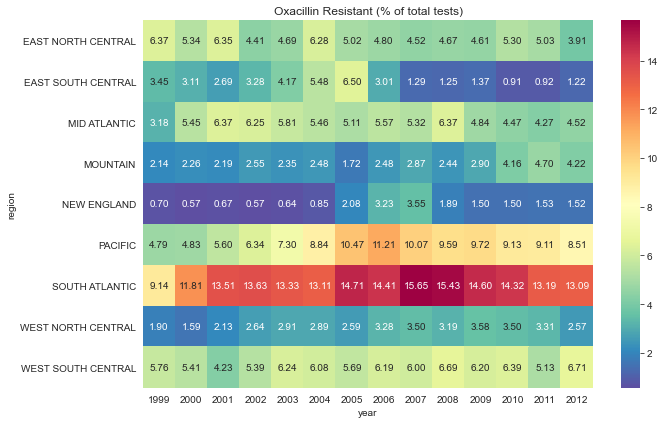

In [87]:
plotheatmapR('Oxacillin')

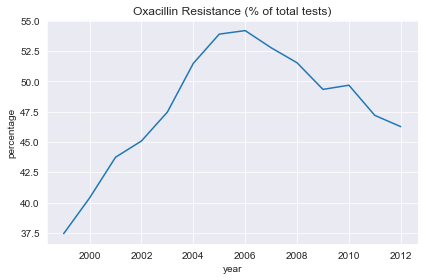

In [38]:
plotlineR('Oxacillin')

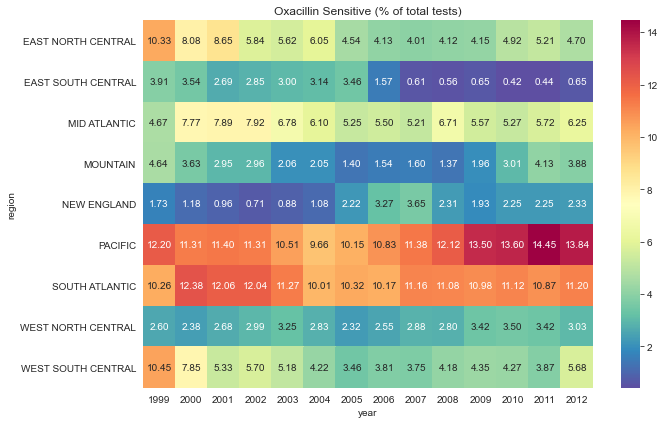

In [43]:
plotheatmapS('Oxacillin')

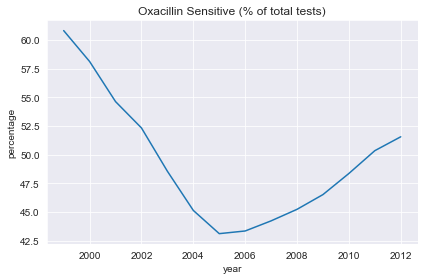

In [44]:
plotlineS('Oxacillin')

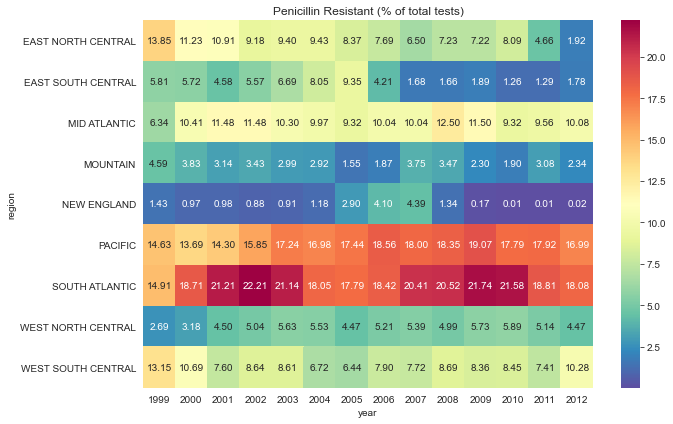

In [41]:
plotheatmapR('Penicillin')

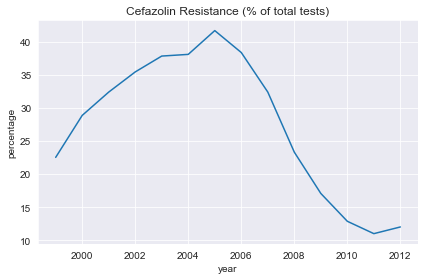

In [70]:
plotlineR('Cefazolin')

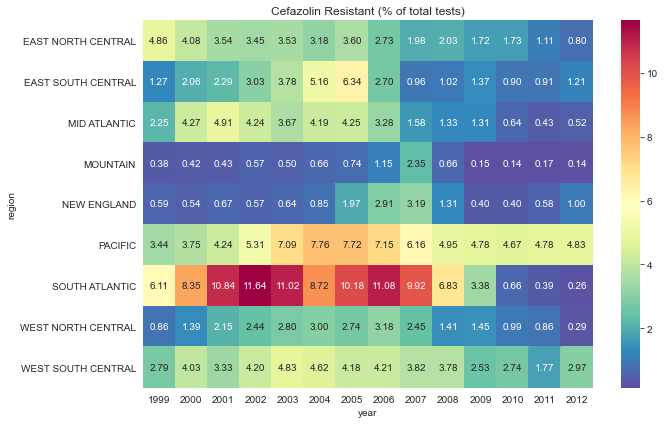

In [71]:
plotheatmapR('Cefazolin')

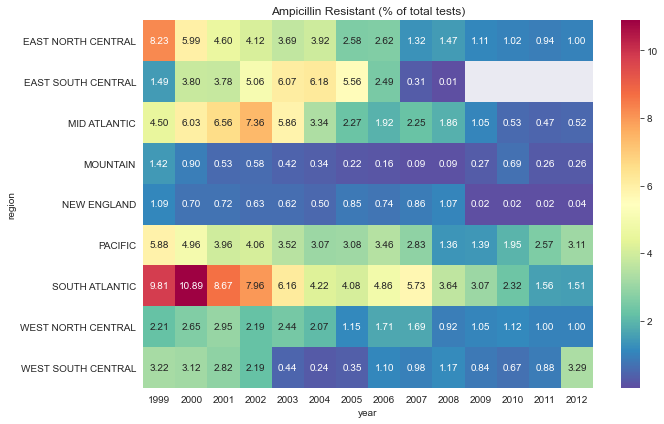

In [9]:
plotheatmapR('Ampicillin')

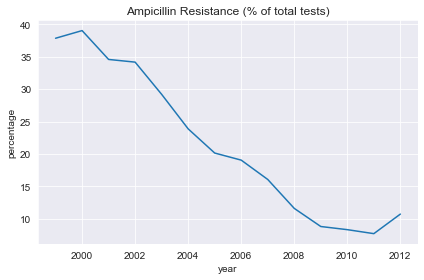

In [10]:
plotlineR('Ampicillin')

In [23]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import rcParams
rcParams.update({'figure.autolayout': True})

def plotheatmapR(drug1):
    heatmapData = pd.DataFrame(columns=['region','count','year'])

    for YEAR in range(1999,2013):
        StaphAureuaDataPath = '/project/biocomplexity/anil/AMR/StaphAureusAntibiogramTimeSpace/RawData/StaphAureua{}.csv'.format(YEAR)
        StaphAureuaData = pd.read_csv(StaphAureuaDataPath)
        yearData = StaphAureuaData.loc[ ((StaphAureuaData[drug1] == 'R') |  (StaphAureuaData[drug1] == 'I'))  ]
        fips_value_counts = yearData['Region'].value_counts()
        df_value_counts = pd.DataFrame(fips_value_counts)
        df_value_counts = df_value_counts.reset_index()
        df_value_counts.columns = ['region', 'count']
        df_value_counts['count'] = (df_value_counts['count'].div(len(StaphAureuaData)))*100
        df_value_counts['year'] = YEAR
        heatmapData=heatmapData.append(df_value_counts)
        
    
    #heatmapData['count'] = heatmapData['count'].astype(int)
    heatmapData = heatmapData.pivot("region", "year", "count")
    heatmapData.fillna(0)
    plt.figure(figsize=(10,6))
    ax = sns.heatmap(heatmapData,cmap="Spectral_r",annot=True,fmt='.2f')
    ax.set_title('{} Resistant (% of total tests)'.format(drug1))
    fig = ax.figure
    fig.savefig('heatmapsR/{}_resistant_heat.png'.format(drug1).replace('/',''),dpi=300)

def plotlineR(drug1):
    percentData = pd.DataFrame(columns=['year','percentage'])
    for YEAR in range(1999,2013):
        StaphAureuaDataPath = '/project/biocomplexity/anil/AMR/StaphAureusAntibiogramTimeSpace/RawData/StaphAureua{}.csv'.format(YEAR)
        StaphAureuaData = pd.read_csv(StaphAureuaDataPath)
        ImipenemAmoxicillinclavulanate = StaphAureuaData.loc[ ((StaphAureuaData[drug1] == 'R') |  (StaphAureuaData[drug1] == 'I'))  ]
        percent=(len(ImipenemAmoxicillinclavulanate)/len(StaphAureuaData))*100
        df2 = {'year': YEAR, 'percentage': percent}
        percentData = percentData.append(df2, ignore_index = True)
    plt = sns.lineplot(data=percentData,x='year',y='percentage')
    plt.set_title('{} Resistance (% of total tests)'.format(drug1))
    fig = plt.figure
    fig.savefig('{}_r_lineplot.png'.format(drug1).replace('/',''),dpi=300)

def plotheatmapS(drug1):
    heatmapData = pd.DataFrame(columns=['region','count','year'])

    for YEAR in range(1999,2013):
        StaphAureuaDataPath = '/project/biocomplexity/anil/AMR/StaphAureusAntibiogramTimeSpace/RawData/StaphAureua{}.csv'.format(YEAR)
        StaphAureuaData = pd.read_csv(StaphAureuaDataPath)
        yearData = StaphAureuaData.loc[(StaphAureuaData[drug1] == 'S')]
        
        fips_value_counts = yearData['Region'].value_counts()
        df_value_counts = pd.DataFrame(fips_value_counts)
        df_value_counts = df_value_counts.reset_index()
        df_value_counts.columns = ['region', 'count']
        df_value_counts['count'] = (df_value_counts['count'].div(len(StaphAureuaData)))*100
        df_value_counts['year'] = YEAR
        heatmapData=heatmapData.append(df_value_counts)
        
    
    #heatmapData['count'] = heatmapData['count'].astype(int)
    heatmapData = heatmapData.pivot("region", "year", "count")
    heatmapData.fillna(0)
    plt.figure(figsize=(10,6))
    ax = sns.heatmap(heatmapData,cmap="Spectral_r",annot=True,fmt='.2f')
    ax.set_title('{} Sensitive (% of total tests)'.format(drug1))
    fig = ax.figure
    fig.savefig('heatmapsS/{}_sensitive_heat.png'.format(drug1).replace('/',''),dpi=300)

def plotlineS(drug1):
    percentData = pd.DataFrame(columns=['year','percentage'])
    for YEAR in range(1999,2013):
        StaphAureuaDataPath = '/project/biocomplexity/anil/AMR/StaphAureusAntibiogramTimeSpace/RawData/StaphAureua{}.csv'.format(YEAR)
        StaphAureuaData = pd.read_csv(StaphAureuaDataPath)
        ImipenemAmoxicillinclavulanate = StaphAureuaData.loc[ (StaphAureuaData[drug1] == 'S')]
        percent=(len(ImipenemAmoxicillinclavulanate)/len(StaphAureuaData))*100
        df2 = {'year': YEAR, 'percentage': percent}
        percentData = percentData.append(df2, ignore_index = True)
    plt = sns.lineplot(data=percentData,x='year',y='percentage')
    plt.set_title('{} Sensitive (% of total tests)'.format(drug1))
    fig = plt.figure
    fig.savefig('{}_s_lineplot.png'.format(drug1).replace('/',''),dpi=300)
    

In [53]:
percentData=pd.read_csv('percentData.csv')

<AxesSubplot:xlabel='percentage'>

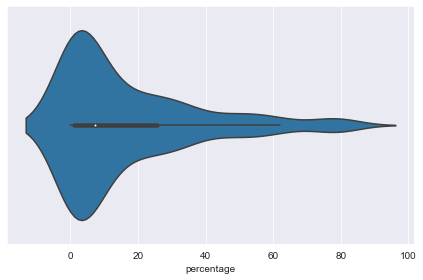

In [40]:
sns.violinplot(x=percentData["percentage"])

<AxesSubplot:xlabel='year', ylabel='percentage'>

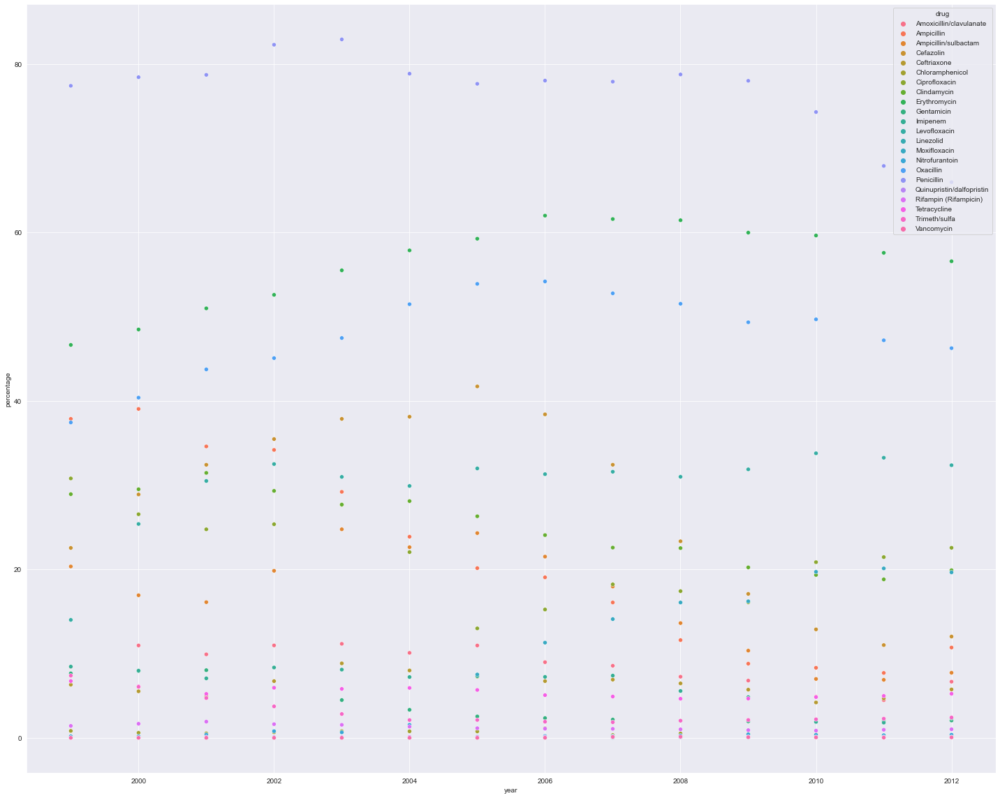

In [50]:
plt.figure(figsize=(20,16))

sns.scatterplot(x='year',y='percentage',hue='drug',data=percentData)

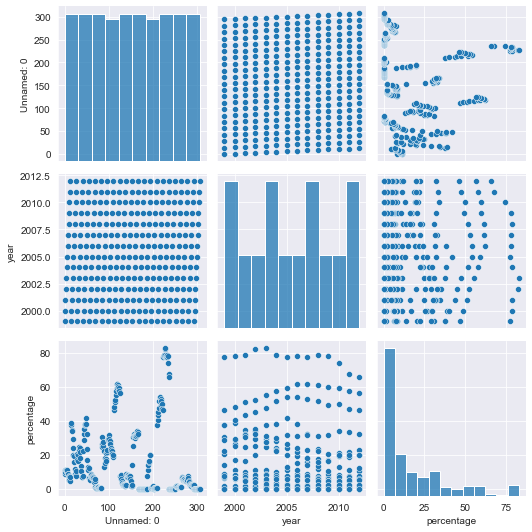

In [55]:
sns.pairplot(percentData)


In [59]:
import pandas as pd
tmp = pd.read_csv('../temp2/AlbuquerqueNM1999.csv')

In [60]:
tmp

,Unnamed: 0,Zipcode,ReportDate,Amoxicillin/clavulanate,Ampicillin,Ampicillin/sulbactam,Cefazolin,Ceftriaxone,Chloramphenicol,Ciprofloxacin,...,Moxifloxacin,Nitrofurantoin,Oxacillin,Penicillin,Quinupristin/dalfopristin,Rifampin (Rifampicin),Tetracycline,Trimeth/sulfa,Vancomycin,HSA_REGION
0,5,87101,1999-01-04,NaN,2,3,4,NaN,NaN,,...,NaN,,16,17,NaN,,,,,AlbuquerqueNM
1,10,87101,1999-01-06,NaN,2,,,NaN,NaN,,...,NaN,,,17,NaN,,,,,AlbuquerqueNM
2,11,87101,1999-01-11,NaN,2,,,NaN,NaN,,...,NaN,,,17,NaN,,,,,AlbuquerqueNM
3,31,87101,1999-01-14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,,NaN,AlbuquerqueNM
4,32,87101,1999-01-05,NaN,2,3,4,NaN,NaN,7,...,NaN,,16,17,NaN,,,NaN,,AlbuquerqueNM
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017,118454,87101,1999-07-21,NaN,2,,,NaN,NaN,,...,NaN,,,17,NaN,,,,,AlbuquerqueNM
2018,118808,87101,1999-04-04,1,NaN,NaN,4,NaN,NaN,7,...,NaN,NaN,16,17,NaN,NaN,,,,AlbuquerqueNM
2019,118954,87102,1999-04-04,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,AlbuquerqueNM
2020,118955,87101,1999-07-17,,NaN,NaN,,NaN,NaN,,...,NaN,NaN,,17,NaN,NaN,,,,AlbuquerqueNM


In [ ]:
def plotlineR(drug1):
    percentData = pd.DataFrame(columns=['year','percentage'])
    for YEAR in range(1999,2013):
        StaphAureuaDataPath = '/project/biocomplexity/anil/AMR/StaphAureusAntibiogramTimeSpace/RawData/StaphAureua{}.csv'.format(YEAR)
        StaphAureuaData = pd.read_csv(StaphAureuaDataPath)
        ImipenemAmoxicillinclavulanate = StaphAureuaData.loc[ ((StaphAureuaData[drug1] == 'R') |  (StaphAureuaData[drug1] == 'I'))  ]
        percent=(len(ImipenemAmoxicillinclavulanate)/len(StaphAureuaData))*100
        df2 = {'year': YEAR, 'percentage': percent}
        percentData = percentData.append(df2, ignore_index = True)
    plt = sns.lineplot(data=percentData,x='year',y='percentage')
    plt.set_title('{} Resistance (% of total tests)'.format(drug1))
    fig = plt.figure
    fig.savefig('{}_r_lineplot.png'.format(drug1).replace('/',''),dpi=300)


In [12]:
associationDict = {
    'Amoxicillin/clavulanate' : '1',
    'Ampicillin' : '2',
    'Ampicillin/sulbactam' : '3',
    'Cefazolin' : '4', 
    'Ceftriaxone' : '5',
    'Chloramphenicol' : '6',
    'Ciprofloxacin' : '7',
    'Clindamycin' : '8',
    'Erythromycin' : '9',
    'Gentamicin' : '10',
    'Imipenem' : '11',
    'Levofloxacin' : '12',
    'Linezolid' : '13',
    'Moxifloxacin' : '14',
    'Nitrofurantoin' : '15',
    'Oxacillin' : '16',
    'Penicillin' : '17',
    'Quinupristin/dalfopristin' : '18',
    'Rifampin (Rifampicin)' : '19',
    'Tetracycline' : '20',
    'Trimeth/sulfa' : '21',
    'Vancomycin' : '22'
}




def plotlinetmp(drug1,drug2,region):
    percentData = pd.DataFrame(columns=['year','percentage'])
    for YEAR in range(1999,2013):
        StaphAureuaDataPath = '../temp2/{}{}.csv'.format(region,YEAR)
        
        try:
            StaphAureuaData = pd.read_csv(StaphAureuaDataPath)
        except OSError as e:
#             df2 = {'year': YEAR, 'percentage': 0}
#             percentData = percentData.append(df2, ignore_index = True)
            continue
        
        ImipenemAmoxicillinclavulanate = StaphAureuaData.loc[ (StaphAureuaData[drug1] == associationDict[drug1]) & (StaphAureuaData[drug2] == associationDict[drug2])   ]
        percent=(len(ImipenemAmoxicillinclavulanate)/len(StaphAureuaData))*100
        df2 = {'year': YEAR, 'percentage': percent}
        percentData = percentData.append(df2, ignore_index = True)
    plt = sns.lineplot(data=percentData,x='year',y='percentage')
    plt.set_title('{} {} -> {}'.format(region,drug1,drug2))
    fig = plt.figure
    fig.savefig('plot_permute/{}_{}_{}_lineplot.png'.format(region,drug1.replace('/',''),drug2.replace('/','')),dpi=300)
#     fig.clf()

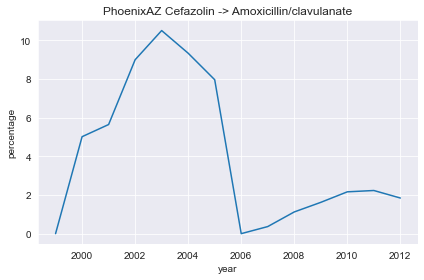

In [13]:
plotlinetmp('Cefazolin','Amoxicillin/clavulanate','PhoenixAZ')

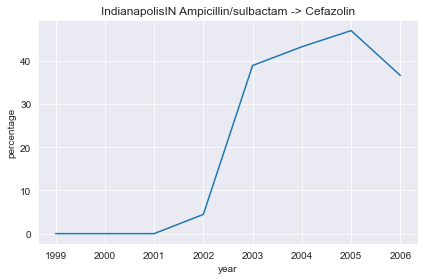

In [14]:
plotlinetmp('Ampicillin/sulbactam','Cefazolin','IndianapolisIN')

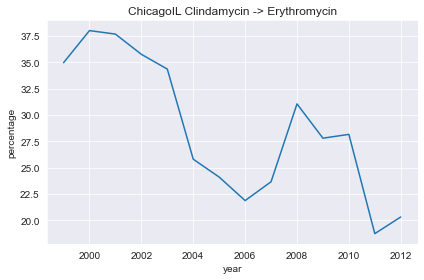

In [15]:
plotlinetmp('Clindamycin','Erythromycin','ChicagoIL')

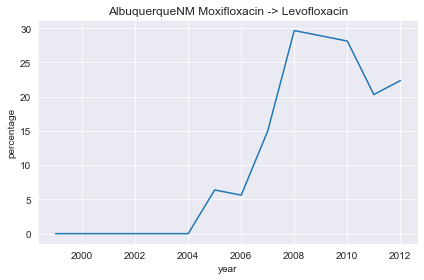

In [16]:
plotlinetmp('Moxifloxacin','Levofloxacin','AlbuquerqueNM') #Moxifloxacin -> Levofloxacin

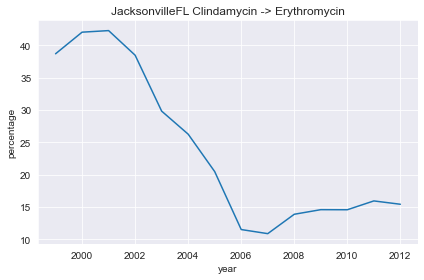

In [116]:
plotlinetmp('Clindamycin','Erythromycin','JacksonvilleFL')#Clindamycin -> Erythromycin

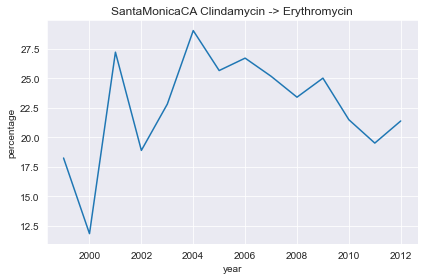

In [117]:
plotlinetmp('Clindamycin','Erythromycin','SantaMonicaCA')

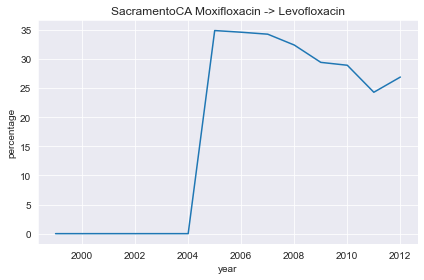

In [118]:
plotlinetmp('Moxifloxacin','Levofloxacin','SacramentoCA')

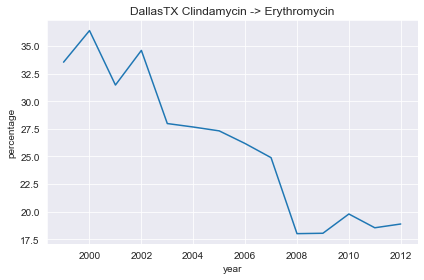

In [119]:
plotlinetmp('Clindamycin','Erythromycin','DallasTX')

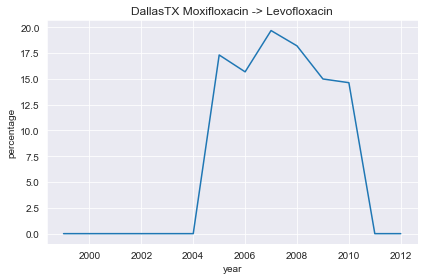

In [120]:
plotlinetmp('Moxifloxacin','Levofloxacin','DallasTX')

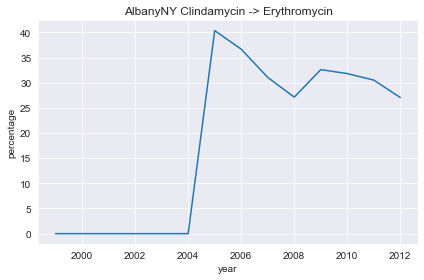

In [122]:
plotlinetmp('Clindamycin','Erythromycin','AlbanyNY')

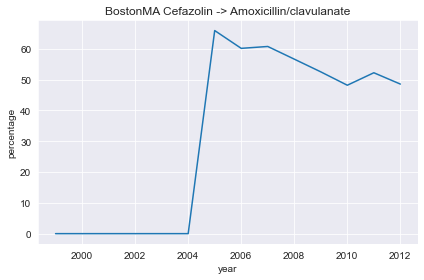

In [123]:
plotlinetmp('Cefazolin','Amoxicillin/clavulanate','BostonMA')

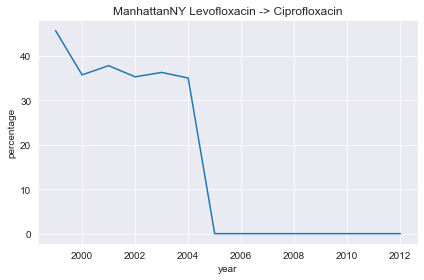

In [124]:
plotlinetmp('Levofloxacin' ,'Ciprofloxacin', 'ManhattanNY')

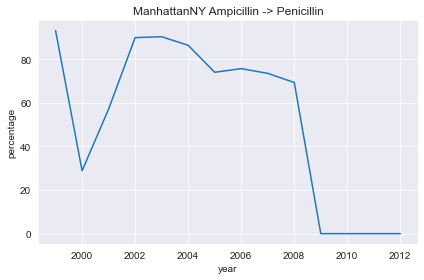

In [125]:
plotlinetmp('Ampicillin' ,'Penicillin', 'ManhattanNY')

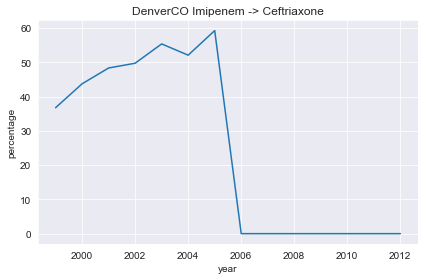

In [6]:
plotlinetmp('Imipenem','Ceftriaxone','DenverCO')

In [4]:
regionList = ["San Antonio TX", "Miami FL", "Richland WA", "Naples FL", "Wilkes-Barre PA", "Danville PA", "Portland OR",
              "Seattle WA", "Wichita KS", "Worcester MA", "Pittsburgh PA", "Boston MA", "Albuquerque NM", "Providence RI",
              "Las Vegas NV", "San Francisco CA", "Raleigh NC", "Detroit MI", "Burlington VT", "Charleston SC", 
              "Jacksonville FL", "Ridgewood NJ", "Omaha NE", "Newberg OR", "Birmingham AL", "Decatur GA", "Melbourne FL",
              "Cocoa Beach FL", "Tavernier FL", "Albany NY", "Santa Monica CA", "Euclid OH", "Cleveland OH", "Houston TX", 
              "Dallas TX", "Southfield MI", "Madison WI", "Tulsa OK", "Newport RI", "Reading PA", "Annapolis MD", 
              "Morgantown WV", "Manhattan NY", "San Diego CA", "Greensboro NC", "Monroe NC", "Fernandina Beach FL", 
              "Chicago IL", "Kings Mountain NC", "South Miami FL", "Sacramento CA", "St. Louis MO", "Boulder City NV", 
              "Mayfield Heights OH", "Durham NC", "Kennewick WA", "Grand Rapids MI", "Bangor ME", "Charlotte NC", 
              "Coral Gables FL", "Shelby NC", "Wilmington DE", "Marlborough MA", "Bethesda MD", "Mount Holly NJ", 
              "Maryville IL", "Philadelphia PA", "Camden NJ", "Takoma Park MD", "Rockville MD", "Minneapolis MN", 
              "Allentown PA", "Bethlehem PA", "Washington DC", "Sapulpa OK", "Memphis TN", "Bartlesville OK", "Coronado CA",
              "La Jolla CA", "Grand Forks ND", "Encinitas CA", "Tacoma WA", "Clinton MA", "Conroe TX", "Mesa AZ", 
              "Phoenix AZ", "Charlottesville VA", "Chula Vista CA", "Evergreen AL", "Long Beach CA", "Oklahoma City OK", 
              "West Chester PA", "Alabaster AL", "Pasco WA", "Fountain Valley CA", "Brownsville TN", "Brockton MA", 
              "Vinita OK", "Burlington MA", "Shreveport LA", "Tillamook/Wheeler OR", "Ann Arbor MI", "New Orleans LA", 
              "Baton Rouge LA", "Fairfax VA", "Hawthorne NV", "Honolulu HI", "Morganton NC", "Valdese NC", "White Plains NY", 
              "Port Chester NY", "Page AZ", "Syracuse NY", "Pocahontas AR", "Atlanta GA", "Austell GA", "Battle Mountain NV", 
              "Bellingham WA", "Bemidji MN", "Biloxi MS", "Buffalo OK", "Bullhead City AZ", "Carson City NV", "Cartersville GA", 
              "Centre AL", "Columbus GA", "Cottage Grove OR", "Cullman AL", "Denver CO", "Dublin GA", "El Paso TX", "Enid OK", "Eugene OR", 
              "Fairview OK", "Fallon NV", "Federal Way WA", "Flemingsburg KY", "Florence OR", "Fort Lauderdale FL", "Fort Payne AL", 
              "Fort Pierce FL", "Fort Wayne IN", "Gainesville GA", "Galveston TX", "Hackensack NJ", "Harrisburg PA", 
              "Henderson NV", "Indianapolis IN", "Iowa City IA", "Jackson MS", "Jasper AL", "Kansas City MO", "Ketchikan AK", 
              "Knoxville TN", "Lakeland FL", "LaMesa CA", "Lexington KY", "Little Rock AR", "Los Alamitos CA", 
              "Los Angeles CA", "Louisville KY", "Lubbock TX", "Miami Beach FL", "Milford MI", "Milwaukee WI", "Mobile AL", "Moulton AL", 
              "Mount Clemens MI", "Munster IN", "Napoleon OH", "Newark NJ", "Newnan GA", "Okeechobee FL", "Okeene OK", "Orlando FL", 
              "Pembroke Pines FL", "Plantation FL", "Port St. Lucie FL", "Reno NV", "Rochester NY", "Salem VA", "Salt Lake City UT", "San Jose CA", 
              "Seaside OR", "Seiling OK", "Sioux Falls SD", "Snellville GA", "Sodus NY", "Spartanburg SC", "Springfield IL", "Stanford CA", "Sylacauga AL", 
              "Talladega AL", "Toledo OH", "Torrance CA", "Truckee CA", "Tucson AZ", "Urbana IL", "Winder GA", "Winnemucca NV"]
drugs = ['Amoxicillin/clavulanate', 'Ampicillin',
       'Ampicillin/sulbactam', 'Cefazolin', 'Ceftriaxone', 'Chloramphenicol',
       'Ciprofloxacin', 'Clindamycin', 'Erythromycin', 'Gentamicin',
       'Imipenem', 'Levofloxacin', 'Linezolid', 'Moxifloxacin',
       'Nitrofurantoin', 'Oxacillin', 'Penicillin',
       'Quinupristin/dalfopristin', 'Rifampin (Rifampicin)', 'Tetracycline',
       'Trimeth/sulfa', 'Vancomycin']

import pandas as pd
import seaborn as sns
associationDict = {
    'Amoxicillin/clavulanate' : '1',
    'Ampicillin' : '2',
    'Ampicillin/sulbactam' : '3',
    'Cefazolin' : '4', 
    'Ceftriaxone' : '5',
    'Chloramphenicol' : '6',
    'Ciprofloxacin' : '7',
    'Clindamycin' : '8',
    'Erythromycin' : '9',
    'Gentamicin' : '10',
    'Imipenem' : '11',
    'Levofloxacin' : '12',
    'Linezolid' : '13',
    'Moxifloxacin' : '14',
    'Nitrofurantoin' : '15',
    'Oxacillin' : '16',
    'Penicillin' : '17',
    'Quinupristin/dalfopristin' : '18',
    'Rifampin (Rifampicin)' : '19',
    'Tetracycline' : '20',
    'Trimeth/sulfa' : '21',
    'Vancomycin' : '22'
}




def plotlineDrug(drug1,region):
    percentData = pd.DataFrame(columns=['year','percentage'])
    for YEAR in range(1999,2013):
        StaphAureuaDataPath = '../temp2/{}{}.csv'.format(region,YEAR)
        
        try:
            StaphAureuaData = pd.read_csv(StaphAureuaDataPath)
        except OSError as e:
            df2 = {'year': YEAR, 'percentage': 0}
            percentData = percentData.append(df2, ignore_index = True)
            continue
        
        ImipenemAmoxicillinclavulanate = StaphAureuaData.loc[(StaphAureuaData[drug1] == associationDict[drug1])]
        percent=(len(ImipenemAmoxicillinclavulanate)/len(StaphAureuaData))*100
        df2 = {'year': YEAR, 'percentage': percent}
        percentData = percentData.append(df2, ignore_index = True)
    plt = sns.lineplot(data=percentData,x='year',y='percentage')
    plt.set_title('{} {}'.format(region,drug1))
    fig = plt.figure
    fig.savefig('plots/{}_{}_lineplot.png'.format(region.replace('/',''),drug1.replace('/','')),dpi=300)
    fig.clf()

In [10]:
for region in regionList:
    for drug in drugs:
        plotlineDrug(drug,region.replace(' ',''))

<Figure size 432x288 with 0 Axes>

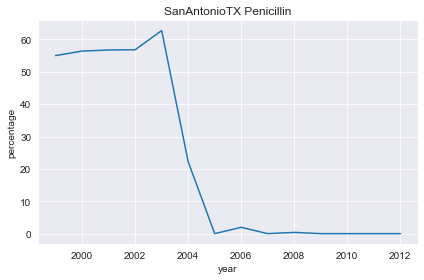

In [6]:
plotlineDrug('Penicillin','SanAntonioTX')

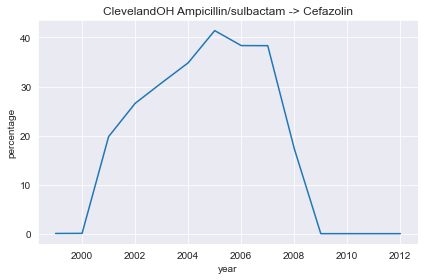

In [11]:
plotlinetmp('Ampicillin/sulbactam','Cefazolin','ClevelandOH')

In [12]:
regionListCheckpoint = [ "Ann Arbor MI", "New Orleans LA", 
              "Baton Rouge LA", "Fairfax VA", "Hawthorne NV", "Honolulu HI", "Morganton NC", "Valdese NC", "White Plains NY", 
              "Port Chester NY", "Page AZ", "Syracuse NY", "Pocahontas AR", "Atlanta GA", "Austell GA", "Battle Mountain NV", 
              "Bellingham WA", "Bemidji MN", "Biloxi MS", "Buffalo OK", "Bullhead City AZ", "Carson City NV", "Cartersville GA", 
              "Centre AL", "Columbus GA", "Cottage Grove OR", "Cullman AL", "Denver CO", "Dublin GA", "El Paso TX", "Enid OK", "Eugene OR", 
              "Fairview OK", "Fallon NV", "Federal Way WA", "Flemingsburg KY", "Florence OR", "Fort Lauderdale FL", "Fort Payne AL", 
              "Fort Pierce FL", "Fort Wayne IN", "Gainesville GA", "Galveston TX", "Hackensack NJ", "Harrisburg PA", 
              "Henderson NV", "Indianapolis IN", "Iowa City IA", "Jackson MS", "Jasper AL", "Kansas City MO", "Ketchikan AK", 
              "Knoxville TN", "Lakeland FL", "LaMesa CA", "Lexington KY", "Little Rock AR", "Los Alamitos CA", 
              "Los Angeles CA", "Louisville KY", "Lubbock TX", "Miami Beach FL", "Milford MI", "Milwaukee WI", "Mobile AL", "Moulton AL", 
              "Mount Clemens MI", "Munster IN", "Napoleon OH", "Newark NJ", "Newnan GA", "Okeechobee FL", "Okeene OK", "Orlando FL", 
              "Pembroke Pines FL", "Plantation FL", "Port St. Lucie FL", "Reno NV", "Rochester NY", "Salem VA", "Salt Lake City UT", "San Jose CA", 
              "Seaside OR", "Seiling OK", "Sioux Falls SD", "Snellville GA", "Sodus NY", "Spartanburg SC", "Springfield IL", "Stanford CA", "Sylacauga AL", 
              "Talladega AL", "Toledo OH", "Torrance CA", "Truckee CA", "Tucson AZ", "Urbana IL", "Winder GA", "Winnemucca NV"]

In [13]:
for region in regionListCheckpoint:
    for drug1 in drugs:
        for drug2 in drugs:
            plotlinetmp(drug1,drug2,region.replace(' ',''))

<Figure size 432x288 with 0 Axes>

In [19]:
drugs = ['Amoxicillin/clavulanate', 'Ampicillin',
       'Ampicillin/sulbactam', 'Cefazolin', 'Ceftriaxone', 'Chloramphenicol',
       'Ciprofloxacin', 'Clindamycin', 'Erythromycin', 'Gentamicin',
       'Imipenem', 'Levofloxacin', 'Linezolid', 'Moxifloxacin',
       'Nitrofurantoin', 'Oxacillin', 'Penicillin',
       'Quinupristin/dalfopristin', 'Rifampin (Rifampicin)', 'Tetracycline',
       'Trimeth/sulfa', 'Vancomycin']

<ipython-input-20-bfe8adc13544>:27: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(10,6))


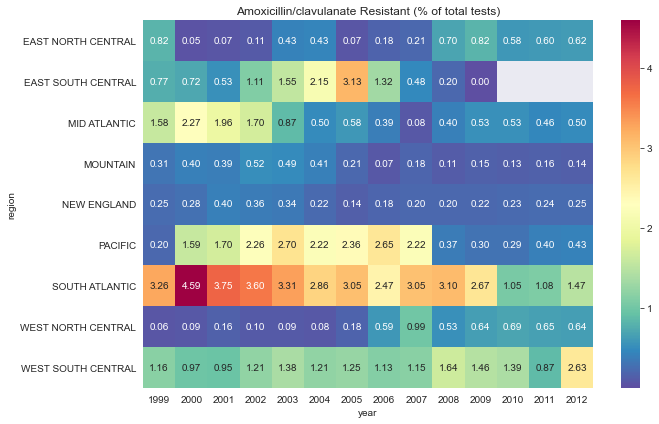

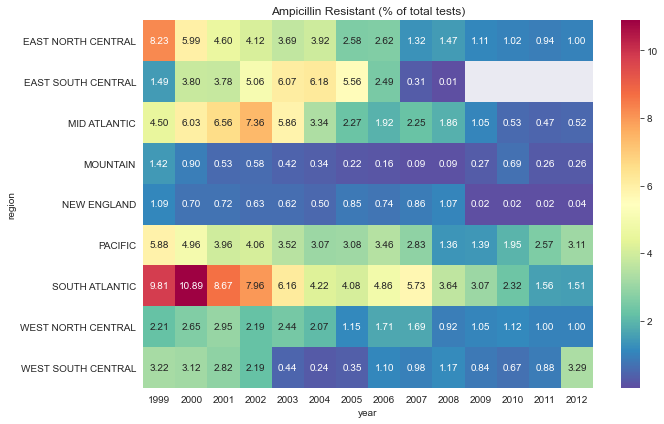

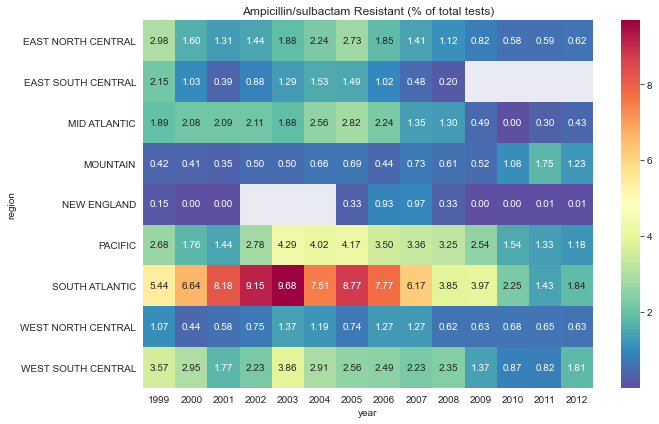

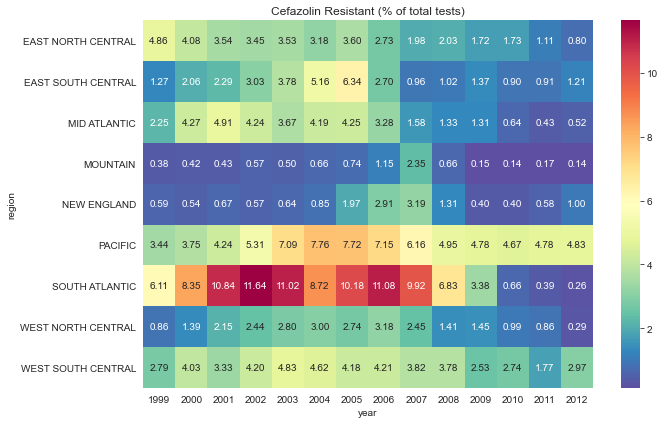

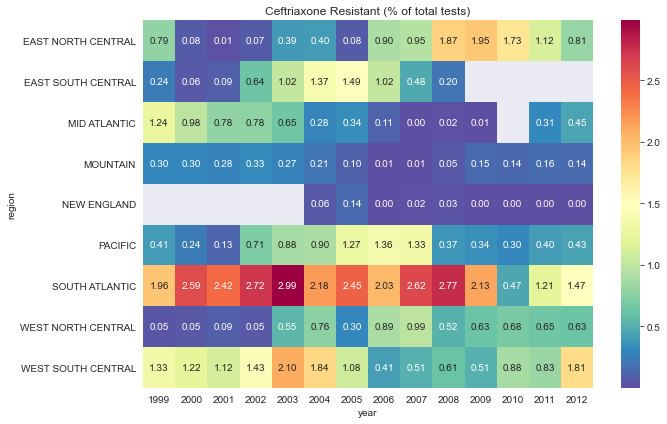

...

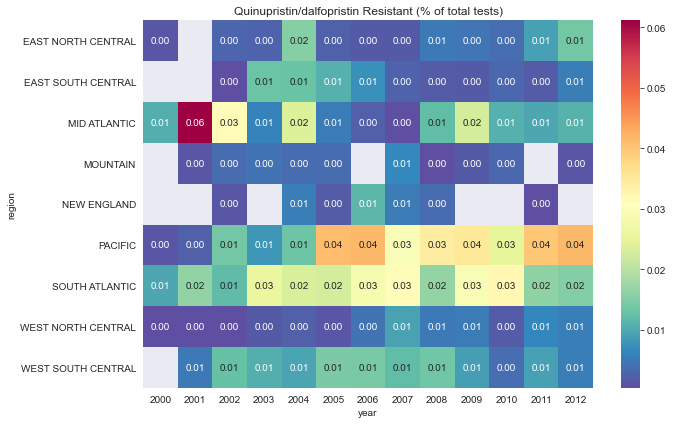

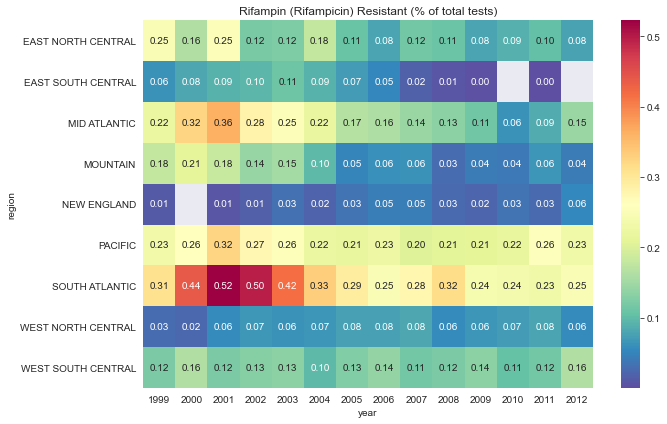

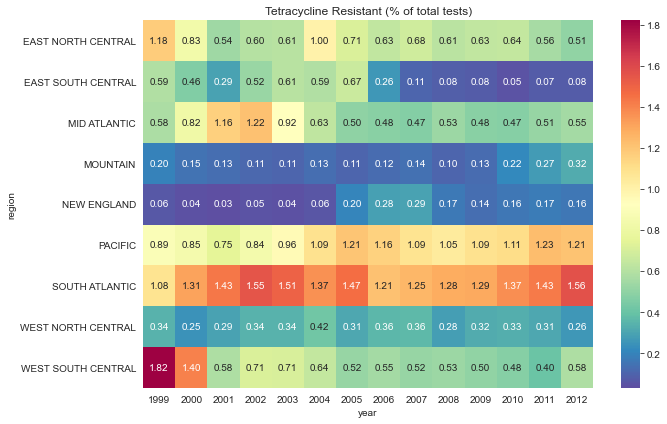

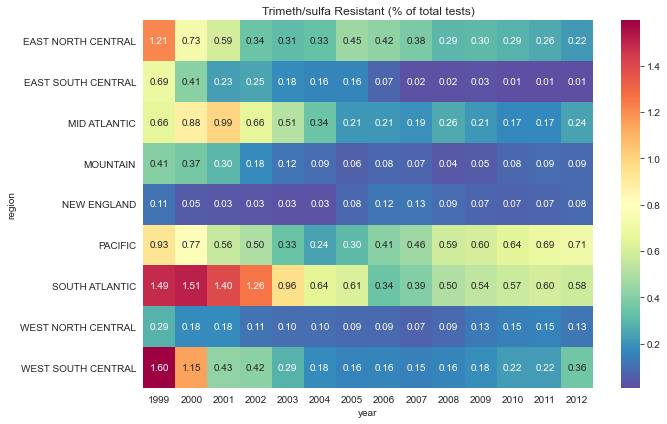

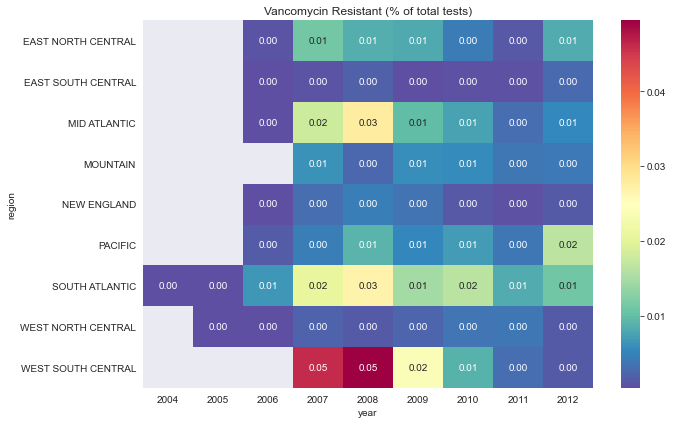

In [21]:
for drug in drugs:
    plotheatmapR(drug)

<ipython-input-23-4714e6620dde>:67: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize=(10,6))


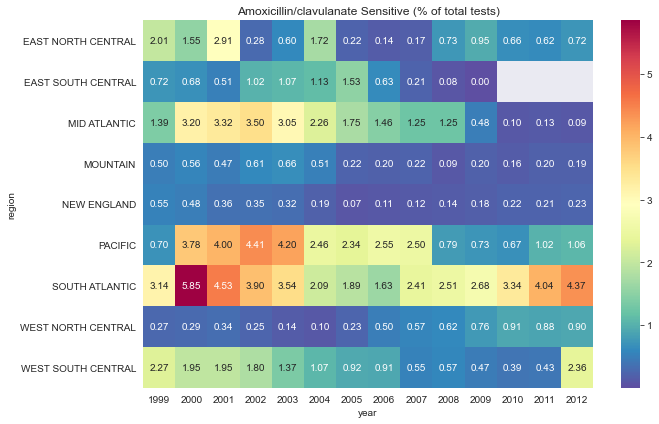

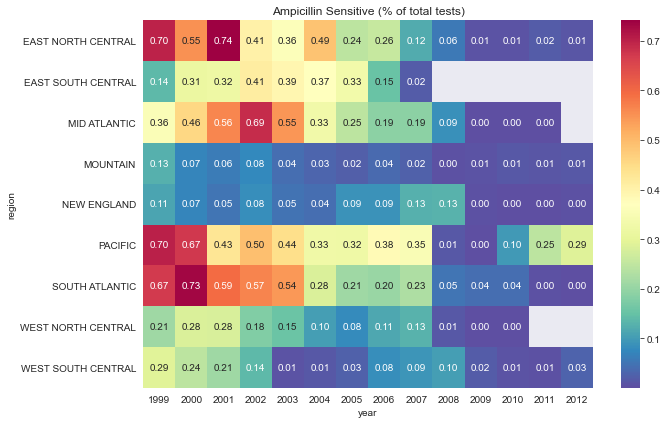

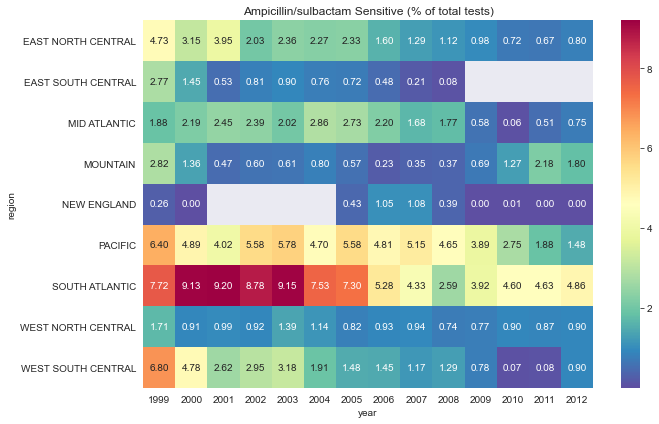

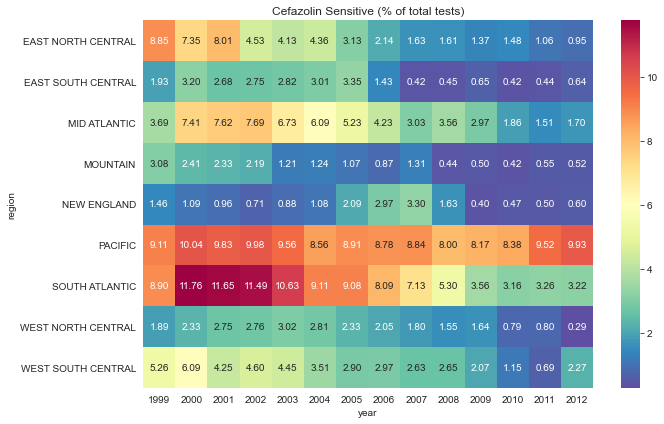

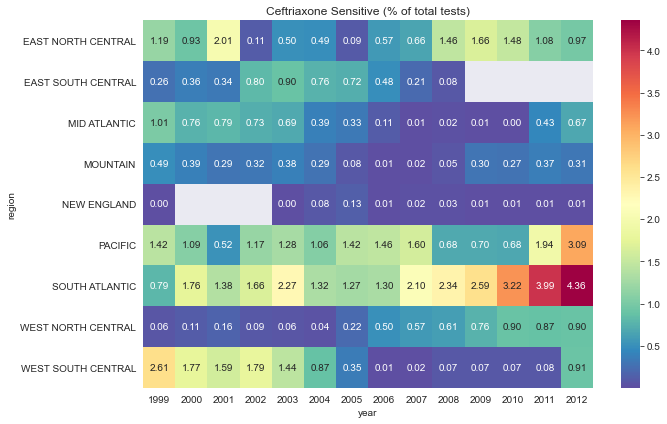

...

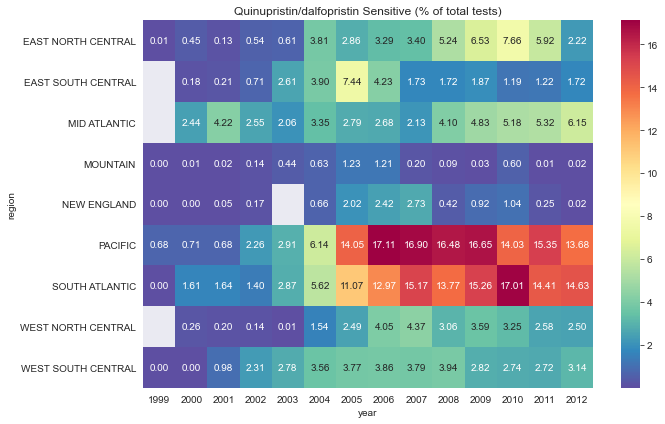

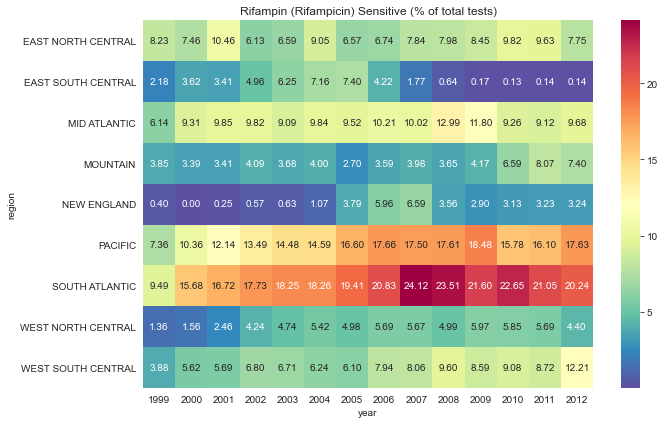

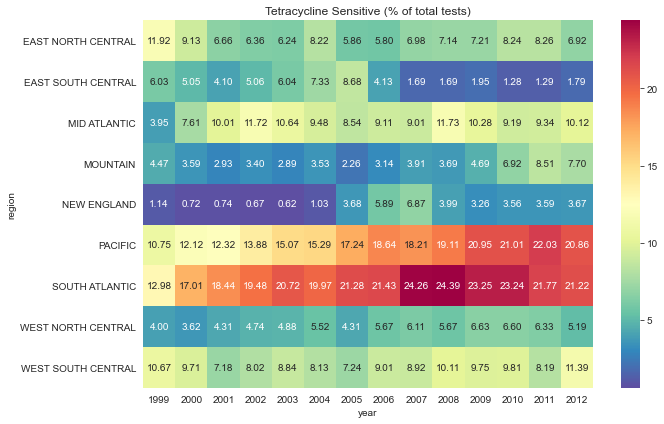

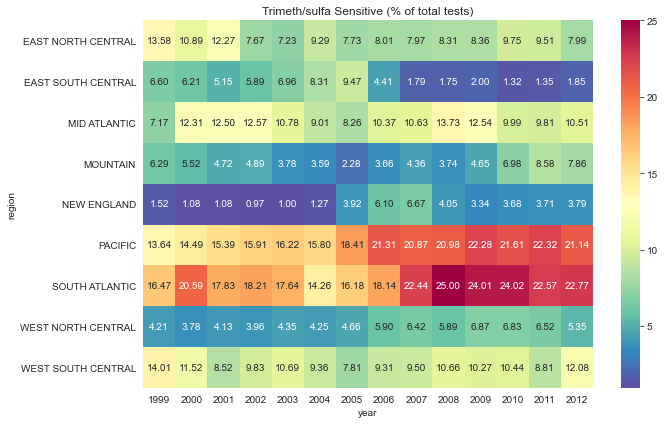

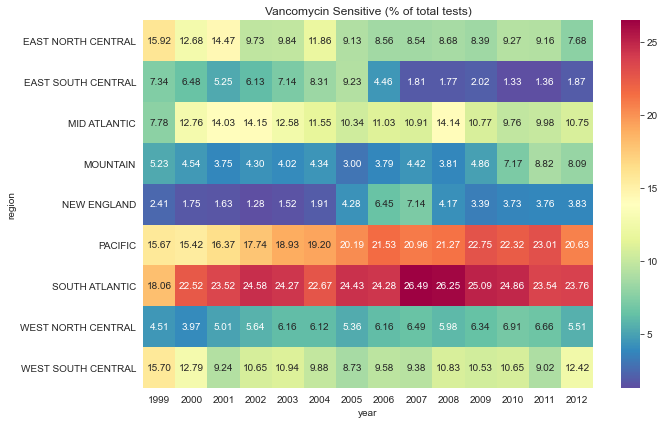

In [24]:
for drug in drugs:
    plotheatmapS(drug)

In [2]:
regionList = ['Phoenix AZ',
 'Page AZ',
 'Mesa AZ',
 'Burlington VT',
 'Seattle WA',
 'Wichita KS',
 'Portland OR',
 'Tulsa OK',
 'Grand Rapids MI',
 'Chula Vista CA',
 'La Jolla CA',
 'St. Louis MO',
 'Allentown PA',
 'Boston MA',
 'Newberg OR',
 'Seaside OR',
 'Pocahontas AR',
 'Houston TX',
 'Charlotte NC',
 'Monroe NC',
 'Shelby NC',
 'Syracuse NY',
 'Santa Monica CA',
 'Mayfield Heights OH',
 'Cleveland OH',
 'Euclid OH',
 'Morgantown WV',
 'Albuquerque NM',
 'Maryville IL',
 'White Plains NY',
 'Sacramento CA',
 'Torrance CA',
 'Fountain Valley CA',
 'Bangor ME',
 'Ridgewood NJ',
 'Grand Forks ND',
 'Valdese NC',
 'Morganton NC',
 'Kennewick WA',
 'Danville PA',
 'Wilkes-Barre PA',
 'Dallas TX',
 'Chicago IL',
 'Coral Gables FL',
 'South Miami FL',
 'Miami FL',
 'Tavernier FL',
 'Birmingham AL',
 'Takoma Park MD',
 'Washington DC',
 'Rockville MD',
 'Madison WI',
 'Burlington MA',
 'Pasco WA',
 'Charlottesville VA',
 'Raleigh NC',
 'Greensboro NC',
 'Jacksonville FL',
 'Fernandina Beach FL',
 'New Orleans LA',
 'Encinitas CA',
 'San Diego CA',
 'Omaha NE',
 'Detroit MI',
 'Decatur GA',
 'Conroe TX',
 'Annapolis MD',
 'Sapulpa OK',
 'Brockton MA',
 'Bethlehem PA',
 'Vinita OK',
 'Richland WA',
 'Evergreen AL',
 'Bartlesville OK',
 'Albany NY',
 'Brownsville TN',
 'Wilmington DE',
 'Kings Mountain NC',
 'Port Chester NY',
 'Baton Rouge LA',
 'Reading PA',
 'Minneapolis MN',
 'Bethesda MD',
 'San Francisco CA',
 'Denver CO',
 'Los Angeles CA',
 'Hackensack NJ',
 'Fort Lauderdale FL',
 'Southfield MI',
 'Miami Beach FL',
 'Atlanta GA',
 'Spartanburg SC',
 'Tacoma WA',
 'Federal Way WA',
 'Fort Pierce FL',
 'Long Beach CA',
 'Naples FL',
 'Indianapolis IN',
 'Mobile AL',
 'San Antonio TX',
 'Manhattan NY',
 'Shreveport LA',
 'Memphis TN',
 'Salt Lake City UT',
 'Rochester NY',
 'Kansas City MO',
 'Durham NC',
 'Los Alamitos CA',
 'Knoxville TN',
 'Springfield IL',
 'Sioux Falls SD',
 'Charleston SC',
 'Lexington KY',
 'Lakeland FL',
 'Las Vegas NV',
 'Honolulu HI',
 'Iowa City IA',
 'Little Rock AR',
 'Harrisburg PA',
 'Camden NJ',
 'Port St. Lucie FL',
 'Plantation FL',
 'Atlantis FL',
 'West Palm Beach FL',
 'Stanford CA',
 'Sodus NY',
 'Biloxi MS',
 'Oklahoma City OK',
 'Okeechobee FL',
 'Dublin GA',
 'Pembroke Pines FL',
 'Cottage Grove OR',
 'Newark NJ',
 'Eugene OR',
 'Columbus GA',
 'Bellingham WA',
 'Ketchikan AK',
 'Munster IN',
 'Salem VA',
 'Cartersville GA',
 'Boulder City NV',
 'Bemidji MN',
 'Newnan GA',
 'Mount Holly NJ',
 'Reno NV',
 'Coronado CA',
 'Louisville KY',
 'LaMesa CA',
 'Pittsburgh PA',
 'Melbourne FL',
 'Cocoa Beach FL',
 'Hawthorne NV',
 'Talladega AL',
 'Fort Payne AL',
 'Philadelphia PA',
 'Worcester MA',
 'Milford MI',
 'Clinton MA',
 'Marlborough MA',
 'Moulton AL',
 'Alabaster AL',
 'Jasper AL',
 'Centre AL',
 'Cullman AL',
 'Carson City NV',
 'Battle Mountain NV',
 'West Chester PA',
 'Sylacauga AL',
 'Ann Arbor MI',
 'Tillamook Wheeler OR',
 'Flemingsburg KY',
 'Providence RI',
 'Newport RI',
 'Fallon NV',
 'Truckee CA',
 'Toledo OH',
 'San Jose CA',
 'Lubbock TX',
 'Milwaukee WI',
 'El Paso TX',
 'Austell GA',
 'Winder GA',
 'Henderson NV',
 'Fort Wayne IN',
 'Tucson AZ',
 'Snellville GA',
 'Gainesville GA',
 'Fairfax VA',
 'Winnemucca NV',
 'Galveston TX',
 'Jackson MS',
 'Urbana IL',
 'Enid OK',
 'Okeene OK',
 'Fairview OK',
 'Seiling OK',
 'Buffalo OK',
 'Bullhead City AZ',
 'Florence OR',
 'Orlando FL',
 'Mount Clemens MI',
 'Napoleon OH',
 'Muskogee OK']

In [50]:
import pandas as pd
def plotheatmapR(drug1):
    
    heatmapData = pd.DataFrame(columns=['region','count','year'])
    

    for region in regionList:
        for YEAR in range(1999,2013):
            
            StaphAureuaDataPath = 'splitData/{}{}.csv'.format(region.replace(' ',''),YEAR)
        
            try:
                StaphAureuaData = pd.read_csv(StaphAureuaDataPath)
            except OSError as e:
                df2 = {'region':region , 'count':0 , 'year':YEAR}
                heatmapData = heatmapData.append(df2, ignore_index = True)
                continue
            

            yearData = StaphAureuaData.loc[ ((StaphAureuaData[drug1] == 'R') |  (StaphAureuaData[drug1] == 'I'))  ]
            df = {'region':region , 'count' : (len(yearData)/len(StaphAureuaData))*100 , 'year':YEAR}
            heatmapData=heatmapData.append(df,ignore_index=True)
    return(heatmapData)

In [61]:
dfplot = plotheatmapR('Oxacillin')

In [62]:
dfplot = dfplot.pivot("region", "year", "count")
dfplot.fillna(0)

year,1999,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012
region,,,,,,,,,,,,,,
Alabaster AL,0.000000,0.000000,0.000000,0.000000,0.000000,57.865169,62.268266,72.631579,100.000000,41.176471,40.000000,100.000000,0.000000,0.000000
Albany NY,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,48.000000,49.666667,49.488055,55.018587,54.710145,47.552448,40.909091,45.901639
Albuquerque NM,36.795252,27.362708,32.283858,39.202581,41.858464,50.296581,52.564895,51.635585,52.442641,51.755433,49.095607,48.308166,45.828949,43.461372
Allentown PA,0.000000,40.820981,45.954871,47.215496,45.116441,48.933242,49.970845,50.822281,43.740573,39.536044,42.448726,47.112721,44.148490,46.594134
Ann Arbor MI,0.000000,0.000000,50.000000,0.000000,0.000000,0.000000,50.925926,53.846154,47.058824,35.714286,42.857143,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Wilkes-Barre PA,24.675325,28.571429,41.237113,0.000000,0.000000,49.354005,50.453172,57.301587,54.208417,53.333333,46.134663,47.544910,49.118943,45.766129
Wilmington DE,0.000000,49.309665,50.261415,49.470199,52.889994,54.094955,53.513971,53.956438,53.368146,51.898089,50.373778,47.955165,31.748768,33.597046
Winder GA,46.153846,48.000000,52.000000,41.666667,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


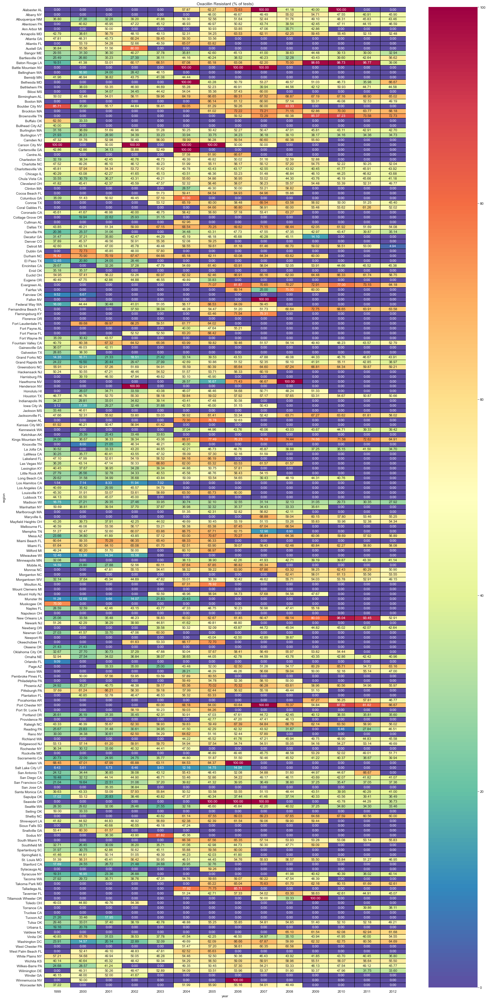

In [63]:

    plt.figure(figsize=(20,40))
    ax = sns.heatmap(dfplot,cmap="Spectral_r",linewidths=1, linecolor='black',annot=True,fmt='.2f') #annot=True,fmt='.2f'
    drug1='Oxacillin'
    ax.set_title('{} Resistant (% of tests)'.format(drug1))
    fig = ax.figure
    fig.savefig('HSACityHeatmaps/{}_resistant_heat.pdf'.format(drug1),dpi=500)

In [3]:
import pandas as pd
def plotheatmapHSA(drug1,drug2):
    
    heatmapData = pd.DataFrame(columns=['region','count','year'])
    

    for region in regionList:
        for YEAR in range(1999,2013):
            
            StaphAureuaDataPath = 'splitData/{}{}.csv'.format(region.replace(' ',''),YEAR)
        
            try:
                StaphAureuaData = pd.read_csv(StaphAureuaDataPath)
            except OSError as e:
                df2 = {'region':region , 'count':0 , 'year':YEAR}
                heatmapData = heatmapData.append(df2, ignore_index = True)
                continue
            

            yearData = StaphAureuaData.loc[ ( ((StaphAureuaData[drug1] == 'R') |  (StaphAureuaData[drug1] == 'I')) & ((StaphAureuaData[drug2] == 'R') |  (StaphAureuaData[drug2] == 'I')) )  ]
            validData = StaphAureuaData.loc[ ( ((StaphAureuaData[drug1] == 'S') |(StaphAureuaData[drug1] == 'R') |  (StaphAureuaData[drug1] == 'I')) & ((StaphAureuaData[drug2] == 'S') |(StaphAureuaData[drug2] == 'R') |  (StaphAureuaData[drug2] == 'I')) )]
            
            try:
                percent = (len(yearData)/len(StaphAureuaData))*100
            except ZeroDivisionError as divError:
                percent = 0.0
            
            df = {'region':region , 'count' : percent , 'year':YEAR}
            heatmapData=heatmapData.append(df,ignore_index=True)
            
    heatmapData = heatmapData.pivot("region", "year", "count")
    heatmapData.fillna(0)
    plt.figure(figsize=(20,40))
    ax = sns.heatmap(heatmapData,cmap="Spectral_r",linewidths=1, linecolor='black',annot=True,fmt='.2f') #annot=True,fmt='.2f'
    ax.set_title('{} -> {} Resistant (% of tests)'.format(drug1,drug2))
    fig = ax.figure
    fig.savefig('HSACityHeatmaps/{}_{}_resistant_heat.pdf'.format(drug1.replace('/',''),drug2.replace('/','')),dpi=500)
    

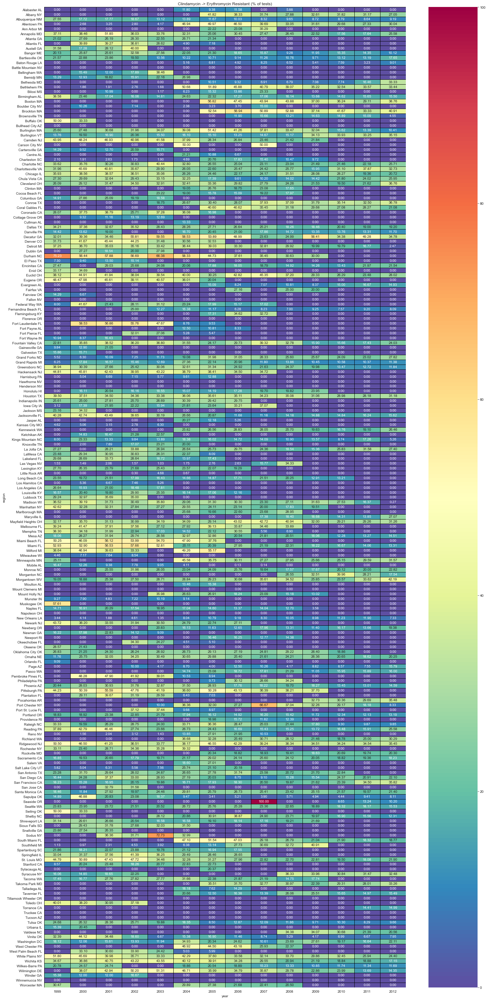

In [28]:
plotheatmapHSA('Clindamycin' , 'Erythromycin' )

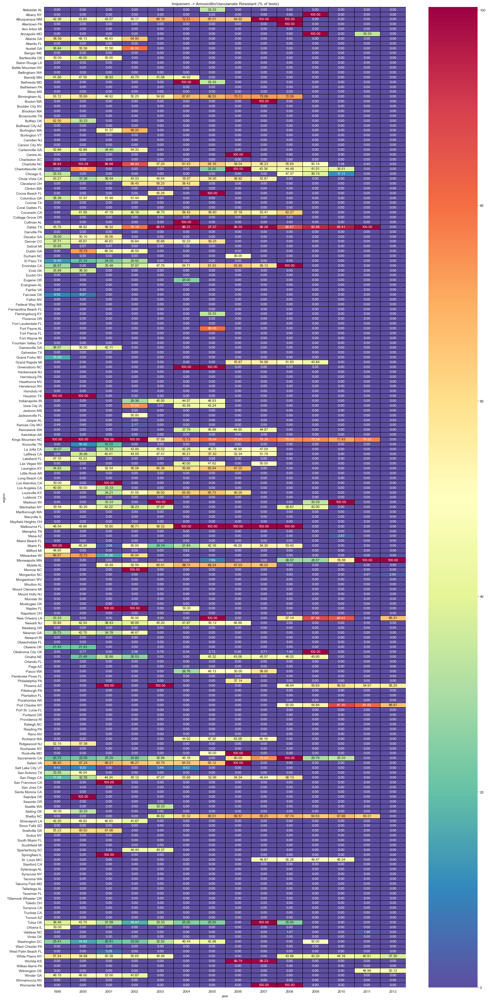

In [10]:
plotheatmapHSA('Imipenem' , 'Amoxicillin/clavulanate' )

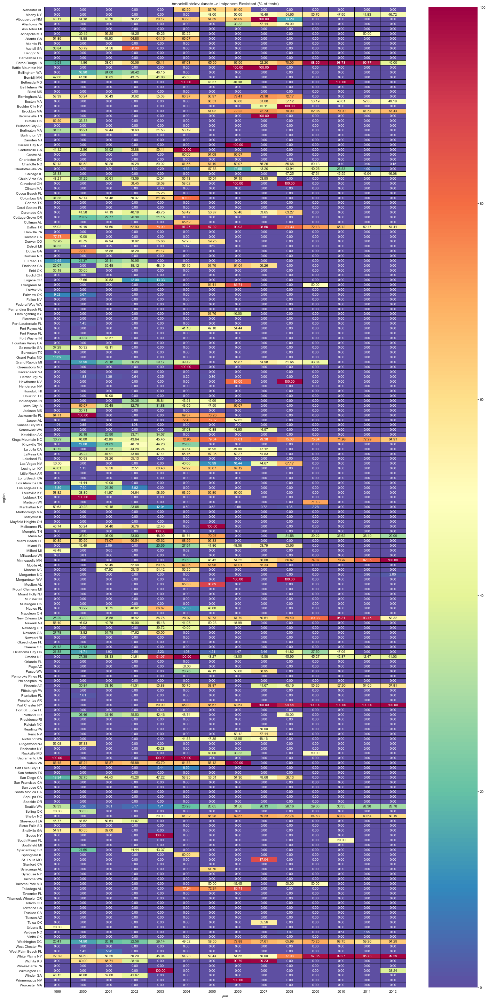

In [12]:
plotheatmapHSA( 'Amoxicillin/clavulanate' , 'Imipenem' )

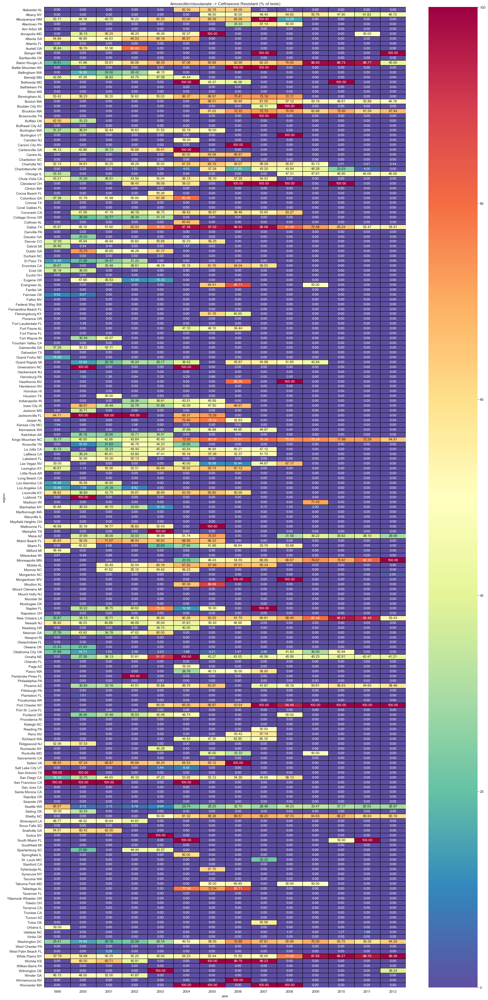

In [13]:
plotheatmapHSA( 'Amoxicillin/clavulanate','Ceftriaxone' )

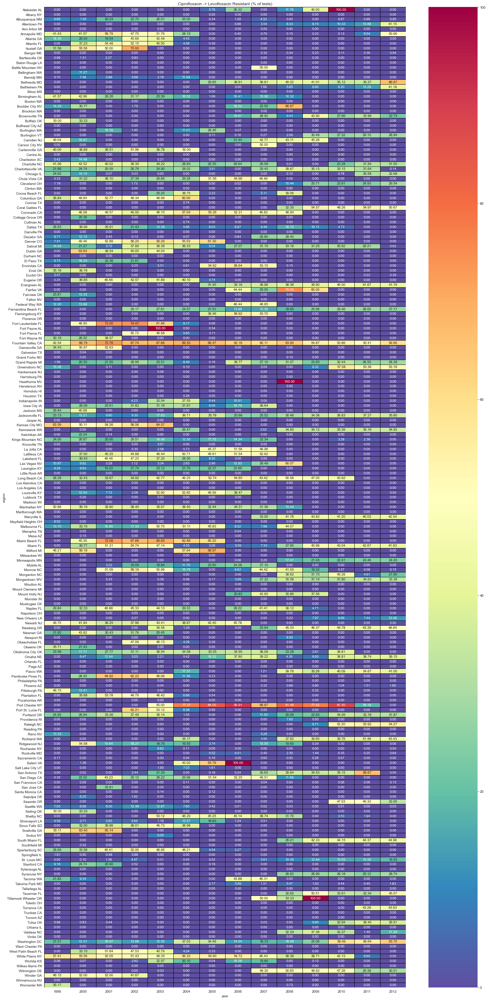

In [27]:
plotheatmapHSA( 'Ciprofloxacin' , 'Levofloxacin' )

In [31]:
# import pandas as pd

    
drugs = ['Amoxicillin/clavulanate', 'Ampicillin',
       'Ampicillin/sulbactam', 'Cefazolin', 'Ceftriaxone', 'Chloramphenicol',
       'Ciprofloxacin', 'Clindamycin', 'Erythromycin', 'Gentamicin',
       'Imipenem', 'Levofloxacin', 'Linezolid', 'Moxifloxacin',
       'Nitrofurantoin', 'Oxacillin', 'Penicillin',
       'Quinupristin/dalfopristin', 'Rifampin (Rifampicin)', 'Tetracycline',
       'Trimeth/sulfa', 'Vancomycin']

def plotheatmapdrugsRegion(region):
    
    heatmapData = pd.DataFrame(columns=['drug','count','year'])
        
    for YEAR in range(1999,2013):
        for drug in drugs:
            
            StaphAureuaDataPath = 'splitData/{}{}.csv'.format(region.replace(' ',''),YEAR)
        
            try:
                StaphAureuaData = pd.read_csv(StaphAureuaDataPath)
            except OSError as e:
                df2 = {'drug':drug , 'count':0 , 'year':YEAR}
                heatmapData = heatmapData.append(df2, ignore_index = True)
                continue


            yearData = StaphAureuaData.loc[ ( ((StaphAureuaData[drug] == 'R') |  (StaphAureuaData[drug] == 'I'))  )  ]
            validData = StaphAureuaData.loc[ ( ((StaphAureuaData[drug] == 'S') |(StaphAureuaData[drug] == 'R') |  (StaphAureuaData[drug] == 'I')) )]

            try:
                percent = (len(yearData)/len(validData))*100
            except ZeroDivisionError as divError:
                percent = 0.0
            
            df = {'drug':drug , 'count' : percent , 'year':YEAR}
            heatmapData=heatmapData.append(df,ignore_index=True)
            
#             try:
#                 percent = (len(yearData)/len(StaphAureuaData))*100
#             except ZeroDivisionError as divError:
#                 percent = 0.0
            
#             df = {'region':region , 'count' : percent , 'year':YEAR}
#             heatmapData=heatmapData.append(df,ignore_index=True)
    #heatmapData['count'] = heatmapData['count'].astype(int)
    heatmapData = heatmapData.pivot("drug", "year", "count")
    heatmapData.fillna(0)
    plt.figure(figsize=(10,6))
    ax = sns.heatmap(heatmapData,cmap="Spectral_r",annot=True,fmt='.2f',linewidths=1, linecolor='white') #annot=True,fmt='.2f'
    ax.set_title('{} Resistant (% of tests)'.format(region))
    fig = ax.figure
    fig.savefig('HSACityHeatmaps/{}_alldrugs_resistant_heat.png'.format(region.replace(' ','')),dpi=500)


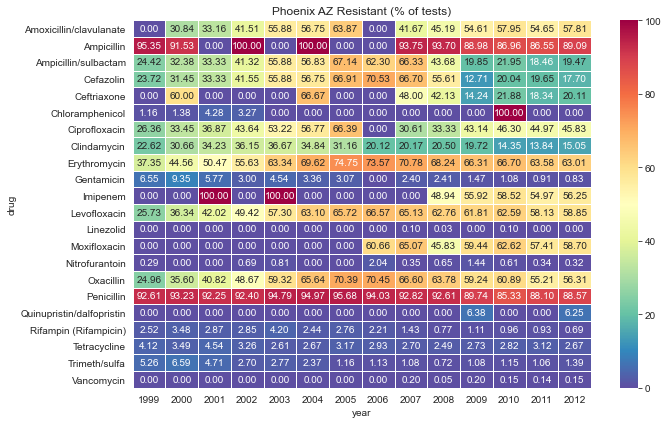

In [32]:
plotheatmapdrugsRegion('Phoenix AZ')

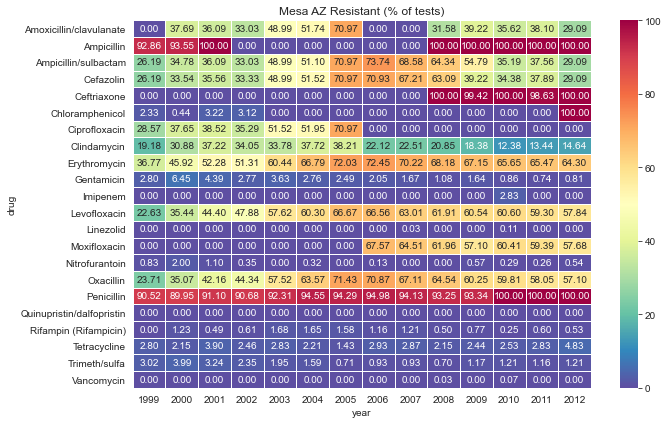

In [38]:
plotheatmapdrugsRegion('Mesa AZ')

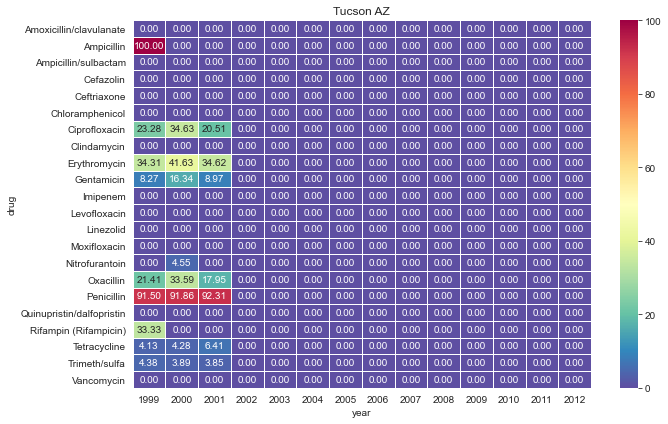

In [30]:
plotheatmapdrugsRegion('Tucson AZ')

In [36]:
# import pandas as pd

    
drugs = ['Amoxicillin/clavulanate', 'Ampicillin',
       'Ampicillin/sulbactam', 'Cefazolin', 'Ceftriaxone', 'Chloramphenicol',
       'Ciprofloxacin', 'Clindamycin', 'Erythromycin', 'Gentamicin',
       'Imipenem', 'Levofloxacin', 'Linezolid', 'Moxifloxacin',
       'Nitrofurantoin', 'Oxacillin', 'Penicillin',
       'Quinupristin/dalfopristin', 'Rifampin (Rifampicin)', 'Tetracycline',
       'Trimeth/sulfa', 'Vancomycin']

def plotheatmapdrugsRegionRawCounts(region):
    
    heatmapData = pd.DataFrame(columns=['drug','count','year'])
        
    for YEAR in range(1999,2013):
        for drug in drugs:
            
            StaphAureuaDataPath = 'splitData/{}{}.csv'.format(region.replace(' ',''),YEAR)
        
            try:
                StaphAureuaData = pd.read_csv(StaphAureuaDataPath)
            except OSError as e:
                df2 = {'drug':drug , 'count':0 , 'year':YEAR}
                heatmapData = heatmapData.append(df2, ignore_index = True)
                continue


            yearData = StaphAureuaData.loc[ ( ((StaphAureuaData[drug] == 'R') |  (StaphAureuaData[drug] == 'I'))  )  ]
            validData = StaphAureuaData.loc[ ( ((StaphAureuaData[drug] == 'S') |(StaphAureuaData[drug] == 'R') |  (StaphAureuaData[drug] == 'I')) )]

            try:
                percent = (len(yearData)/len(validData))*100
            except ZeroDivisionError as divError:
                percent = 0.0
            
            df = {'drug':drug , 'count' : len(yearData) , 'year':YEAR}
            heatmapData=heatmapData.append(df,ignore_index=True)
            
#             try:
#                 percent = (len(yearData)/len(StaphAureuaData))*100
#             except ZeroDivisionError as divError:
#                 percent = 0.0
            
#             df = {'region':region , 'count' : percent , 'year':YEAR}
#             heatmapData=heatmapData.append(df,ignore_index=True)
    heatmapData['count'] = heatmapData['count'].astype(int)
    heatmapData = heatmapData.pivot("drug", "year", "count")
    heatmapData.fillna(0)
    plt.figure(figsize=(10,6))
    ax = sns.heatmap(heatmapData,cmap="Spectral_r",annot=True,fmt='.0f',linewidths=1, linecolor='white') #annot=True,fmt='.2f'
    ax.set_title('{} Resistant (count)'.format(region))
    fig = ax.figure
    fig.savefig('HSACityHeatmaps/{}_alldrugs_resistant_heat_raw.png'.format(region.replace(' ','')),dpi=500)


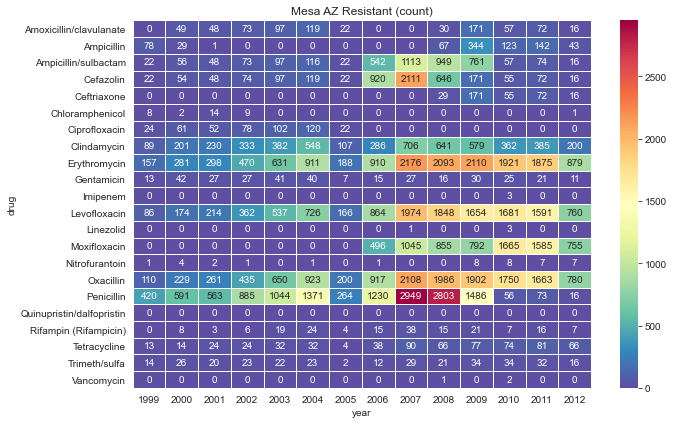

In [37]:
plotheatmapdrugsRegionRawCounts("Mesa AZ")

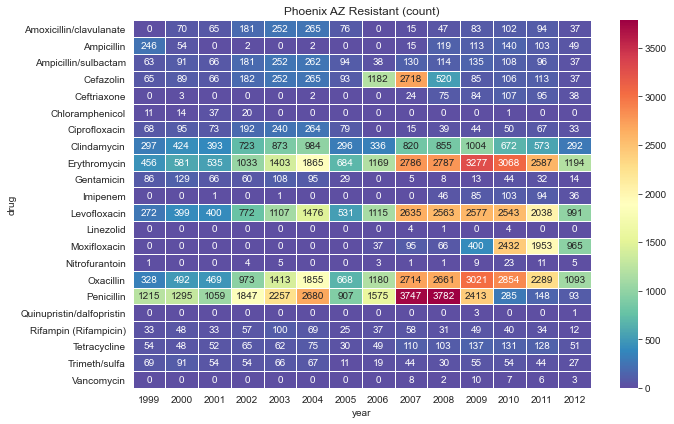

In [39]:
plotheatmapdrugsRegionRawCounts("Phoenix AZ")

In [ ]:
#             'Amoxicillin/clavulanate' : 1,
#             'Ampicillin' : 2,
#             'Ampicillin/sulbactam' : 3,
#             'Cefazolin' : 4, 
#             'Ceftriaxone' : 5,
#             'Chloramphenicol' : 6,
#             'Ciprofloxacin' : 7,
#             'Clindamycin' : 8,
#             'Erythromycin' : 9,
#             'Gentamicin' : 10,
#             'Imipenem' : 11,
#             'Levofloxacin' : 12,
#             'Linezolid' : 13,
#             'Moxifloxacin' : 14,
#             'Nitrofurantoin' : 15,
#             'Penicillin' : 16,
#             'Quinupristin/dalfopristin' : 17,
#             'Rifampin (Rifampicin)' : 18,
#             'Tetracycline' : 19,
#             'Trimeth/sulfa' : 20,
#             'Vancomycin' : 21

In [4]:
#validData = StaphAureuaData.loc[ ( ((StaphAureuaData[drug1] == 'S') |(StaphAureuaData[drug1] == 'R') |  (StaphAureuaData[drug1] == 'I')) & ((StaphAureuaData[drug2] == 'S') |(StaphAureuaData[drug2] == 'R') |  (StaphAureuaData[drug2] == 'I')) )]

# yearData = StaphAureuaData.loc[ ( ((StaphAureuaData[drug1] == 'R') |  (StaphAureuaData[drug1] == 'I')) & ((StaphAureuaData[drug2] == 'R') |  (StaphAureuaData[drug2] == 'I')) )  ]
#             validData = StaphAureuaData.loc[ ( ((StaphAureuaData[drug1] == 'S') |(StaphAureuaData[drug1] == 'R') |  (StaphAureuaData[drug1] == 'I')) & ((StaphAureuaData[drug2] == 'S') |(StaphAureuaData[drug2] == 'R') |  (StaphAureuaData[drug2] == 'I')) )]
            
#             try:
#                 percent = (len(yearData)/len(StaphAureuaData))*100
#             except ZeroDivisionError as divError:
#                 percent = 0.0

def plotlinetmp(drug1,drug2,region):
    percentData = pd.DataFrame(columns=['year','percentage'])
    for YEAR in range(1999,2013):
        StaphAureuaDataPath = 'splitData/{}{}.csv'.format(region,YEAR)
        
        try:
            StaphAureuaData = pd.read_csv(StaphAureuaDataPath)
        except OSError as e:
            df2 = {'year': YEAR, 'percentage': 0}
            percentData = percentData.append(df2, ignore_index = True)
            continue
        
        yearData = StaphAureuaData.loc[ ( ((StaphAureuaData[drug1] == 'R') |  (StaphAureuaData[drug1] == 'I')) & ((StaphAureuaData[drug2] == 'R') |  (StaphAureuaData[drug2] == 'I')) )  ]
        validData = StaphAureuaData.loc[ ( ((StaphAureuaData[drug1] == 'S') |(StaphAureuaData[drug1] == 'R') |  (StaphAureuaData[drug1] == 'I')) & ((StaphAureuaData[drug2] == 'S') |(StaphAureuaData[drug2] == 'R') |  (StaphAureuaData[drug2] == 'I')) )]
            
        try:
            percent = (len(yearData)/len(StaphAureuaData))*100
        except ZeroDivisionError as divError:
            percent = 0.0
        
        #percent=(len(yearData)/len(StaphAureuaData))*100
        df2 = {'year': YEAR, 'percentage': percent}
        percentData = percentData.append(df2, ignore_index = True)
    print(percentData)
    plt = sns.lineplot(data=percentData,x='year',y='percentage')
    plt.set_title('{} {} -> {}'.format(region,drug1,drug2))
    fig = plt.figure
    fig.savefig('{}_{}_{}_lineplot.png'.format(region,drug1.replace('/',''),drug2.replace('/','')),dpi=300)



      year  percentage
0   1999.0    0.741840
1   2000.0    0.766284
2   2001.0    0.000000
3   2002.0    2.166398
4   2003.0   16.713272
5   2004.0   17.079553
6   2005.0   18.495056
7   2006.0    6.878630
8   2007.0    0.015608
9   2008.0    0.000000
10  2009.0    0.000000
11  2010.0    0.000000
12  2011.0    0.000000
13  2012.0    0.000000


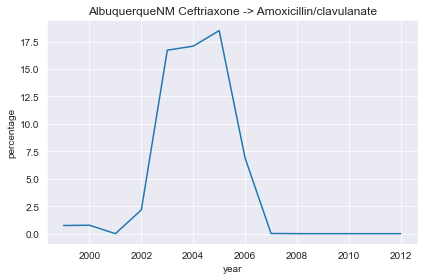

In [5]:
plotlinetmp('Ceftriaxone','Amoxicillin/clavulanate','AlbuquerqueNM') #5 -> 1

In [ ]:
plotlinetmp('Ceftriaxone','Amoxicillin/clavulanate','AlbuquerqueNM') #5 -> 1

      year  percentage
0   1999.0   20.425321
1   2000.0   10.472542
2   2001.0    6.946527
3   2002.0   10.071445
4   2003.0    9.292321
5   2004.0   10.397767
6   2005.0   17.799753
7   2006.0    6.817487
8   2007.0    0.015608
9   2008.0    0.000000
10  2009.0    0.000000
11  2010.0    0.000000
12  2011.0    0.000000
13  2012.0    0.000000


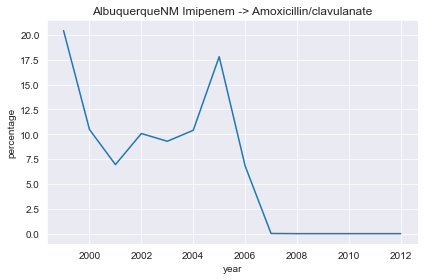

In [6]:
plotlinetmp('Imipenem','Amoxicillin/clavulanate','AlbuquerqueNM') #11 -> 1

      year  percentage
0   1999.0   18.064516
1   2000.0   28.267477
2   2001.0   31.942215
3   2002.0   29.737903
4   2003.0   28.558875
5   2004.0   32.969283
6   2005.0   32.862191
7   2006.0   20.536398
8   2007.0   21.813570
9   2008.0   20.511990
10  2009.0   18.061257
11  2010.0   12.278308
12  2011.0   13.270637
13  2012.0   14.514953


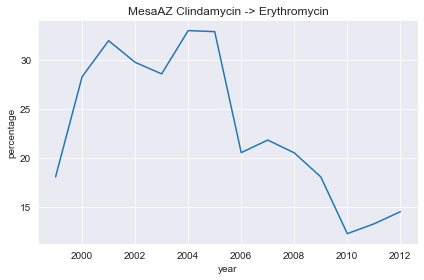

In [14]:
plotlinetmp('Clindamycin','Erythromycin','MesaAZ') #8 -> 9

      year  percentage
0   1999.0   18.617021
1   2000.0    3.870968
2   2001.0    0.000000
3   2002.0    0.099453
4   2003.0    0.000000
5   2004.0    0.070472
6   2005.0    0.000000
7   2006.0    0.000000
8   2007.0    0.366300
9   2008.0    2.844848
10  2009.0    2.185792
11  2010.0    2.949289
12  2011.0    2.472989
13  2012.0    2.508961


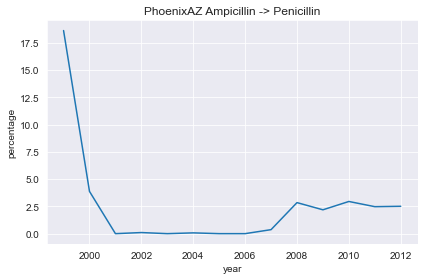

In [17]:
plotlinetmp('Ampicillin','Penicillin','PhoenixAZ')#2 -> 16

      year  percentage
0   1999.0   16.774194
1   2000.0    4.255319
2   2001.0    0.160514
3   2002.0    0.000000
4   2003.0    0.000000
5   2004.0    0.000000
6   2005.0    0.000000
7   2006.0    0.000000
8   2007.0    0.000000
9   2008.0    0.874919
10  2009.0    5.273129
11  2010.0    1.773533
12  2011.0    2.368513
13  2012.0    1.167031


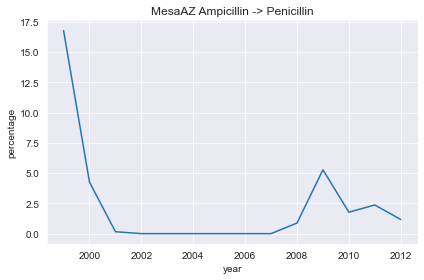

In [16]:
plotlinetmp('Ampicillin','Penicillin','MesaAZ')

      year  percentage
0   1999.0   17.857143
1   2000.0   25.017921
2   2001.0   28.410078
3   2002.0   30.730980
4   2003.0   39.070352
5   2004.0   44.820296
6   2005.0   50.524109
7   2006.0   56.853397
8   2007.0   55.604396
9   2008.0   53.024145
10  2009.0   42.954723
11  2010.0   45.830681
12  2011.0   41.704682
13  2012.0   42.805940


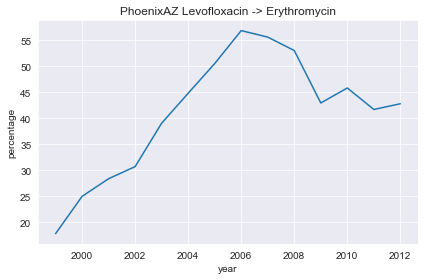

In [19]:
plotlinetmp('Levofloxacin','Erythromycin','PhoenixAZ')#12 -> 9

      year  percentage
0   1999.0   15.483871
1   2000.0   22.796353
2   2001.0   28.250401
3   2002.0   28.830645
4   2003.0   36.994728
5   2004.0   41.228669
6   2005.0   49.823322
7   2006.0   58.084291
8   2007.0   54.248573
9   2008.0   53.532080
10  2009.0   45.374171
11  2010.0   48.601637
12  2011.0   47.056775
13  2012.0   46.608315


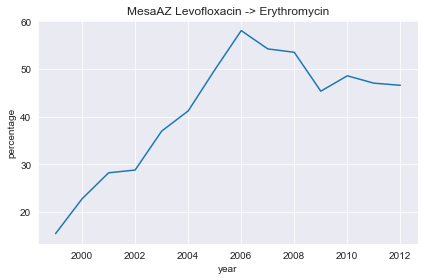

In [20]:
plotlinetmp('Levofloxacin','Erythromycin','MesaAZ')

      year  percentage
0   1999.0    0.000000
1   2000.0    5.017921
2   2001.0    5.647263
3   2002.0    9.000497
4   2003.0   10.510888
5   2004.0    9.231853
6   2005.0    7.966457
7   2006.0    0.000000
8   2007.0    0.366300
9   2008.0    1.123596
10  2009.0    1.619828
11  2010.0    2.164227
12  2011.0    2.232893
13  2012.0    1.843318


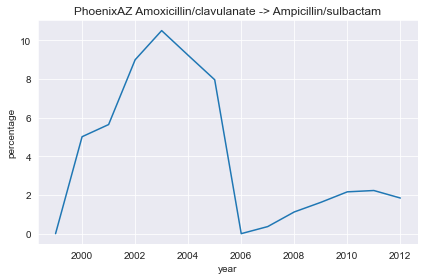

In [11]:
plotlinetmp('Amoxicillin/clavulanate','Ampicillin/sulbactam','PhoenixAZ') #7->4

      year  percentage
0   1999.0    0.000000
1   2000.0    7.446809
2   2001.0    7.704655
3   2002.0    7.358871
4   2003.0    8.523726
5   2004.0    7.918089
6   2005.0    7.773852
7   2006.0    0.000000
8   2007.0    0.000000
9   2008.0    0.972132
10  2009.0    5.399432
11  2010.0    1.944065
12  2011.0    2.507837
13  2012.0    1.167031


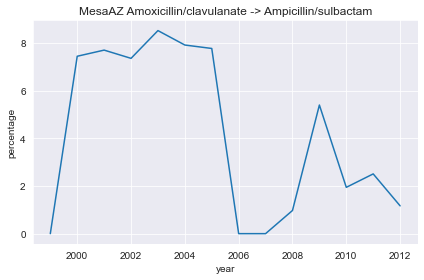

In [12]:
plotlinetmp('Amoxicillin/clavulanate','Ampicillin/sulbactam','MesaAZ') #7->4

      year  percentage
0   1999.0    0.000000
1   2000.0    0.215054
2   2001.0    0.000000
3   2002.0    0.000000
4   2003.0    0.000000
5   2004.0    0.070472
6   2005.0    0.000000
7   2006.0    0.000000
8   2007.0    0.586081
9   2008.0    1.792972
10  2009.0    1.639344
11  2010.0    2.227880
12  2011.0    2.280912
13  2012.0    1.894521
      year  percentage
0   1999.0    0.000000
1   2000.0    0.000000
2   2001.0    0.000000
3   2002.0    0.000000
4   2003.0    0.000000
5   2004.0    0.000000
6   2005.0    0.000000
7   2006.0    0.000000
8   2007.0    0.000000
9   2008.0    0.939728
10  2009.0    5.399432
11  2010.0    1.875853
12  2011.0    2.507837
13  2012.0    1.167031


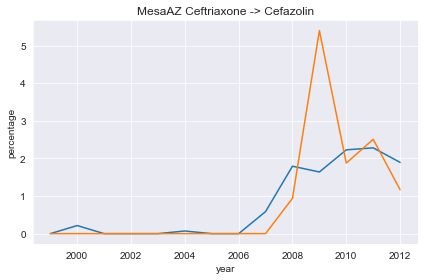

In [80]:
plotlinetmp('Ceftriaxone','Cefazolin','PhoenixAZ') #5->4
plotlinetmp('Ceftriaxone','Cefazolin','MesaAZ') #5->4

      year  percentage
0   1999.0    4.787234
1   2000.0    6.379928
2   2001.0    5.734144
3   2002.0    9.000497
4   2003.0   10.552764
5   2004.0    9.231853
6   2005.0    9.748428
7   2006.0    2.264601
8   2007.0    3.174603
9   2008.0    2.223285
10  2009.0    1.639344
11  2010.0    2.206662
12  2011.0    2.304922
13  2012.0    1.894521


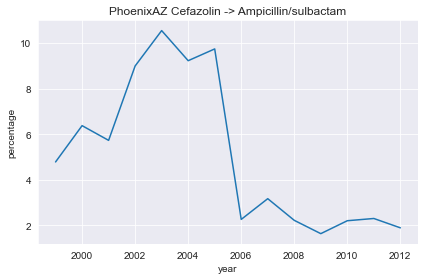

In [76]:
plotlinetmp('Cefazolin','Ampicillin/sulbactam','PhoenixAZ') #4 ->3

      year  percentage
0   1999.0    4.731183
1   2000.0    8.206687
2   2001.0    7.704655
3   2002.0    7.358871
4   2003.0    8.523726
5   2004.0    7.918089
6   2005.0    7.773852
7   2006.0   41.532567
8   2007.0   35.288523
9   2008.0   16.104990
10  2009.0    5.399432
11  2010.0    1.875853
12  2011.0    2.507837
13  2012.0    1.167031


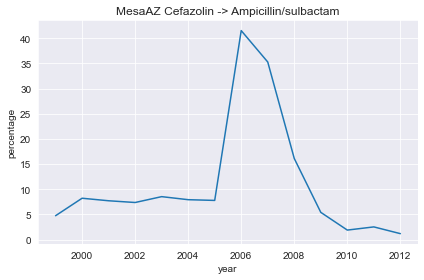

In [77]:
plotlinetmp('Cefazolin','Ampicillin/sulbactam','MesaAZ')

      year  percentage
0   1999.0    4.731183
1   2000.0    8.206687
2   2001.0    7.704655
3   2002.0    7.358871
4   2003.0    8.523726
5   2004.0    7.918089
6   2005.0    7.773852
7   2006.0   41.532567
8   2007.0   35.288523
9   2008.0   16.104990
10  2009.0    5.399432
11  2010.0    1.875853
12  2011.0    2.507837
13  2012.0    1.167031


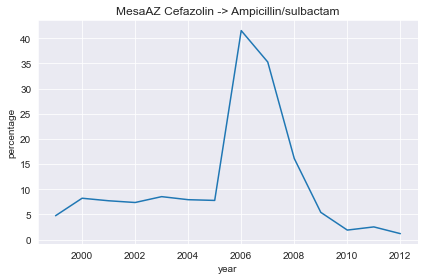

In [55]:
plotlinetmp('Cefazolin','Ampicillin/sulbactam','MesaAZ')


      year  percentage
0   1999.0    0.000000
1   2000.0    0.000000
2   2001.0    0.000000
3   2002.0    0.000000
4   2003.0    0.000000
5   2004.0    0.000000
6   2005.0    0.000000
7   2006.0    2.205006
8   2007.0    2.319902
9   2008.0    1.530002
10  2009.0    7.786885
11  2010.0   51.517080
12  2011.0   46.794718
13  2012.0   49.155146
      year  percentage
0   1999.0    0.000000
1   2000.0    0.000000
2   2001.0    0.000000
3   2002.0    0.000000
4   2003.0    0.000000
5   2004.0    0.000000
6   2005.0    0.000000
7   2006.0   37.777778
8   2007.0   33.037413
9   2008.0   27.640959
10  2009.0   24.976318
11  2010.0   56.753070
12  2011.0   54.893765
13  2012.0   55.069292


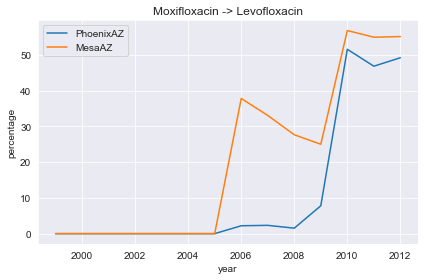

In [70]:
plotlinetmp('Moxifloxacin','Levofloxacin','PhoenixAZ') #14->12
plotlinetmp('Moxifloxacin','Levofloxacin','MesaAZ')

      year  percentage
0   1999.0    0.000000
1   2000.0    0.000000
2   2001.0    0.000000
3   2002.0    0.000000
4   2003.0    0.000000
5   2004.0    0.000000
6   2005.0    0.000000
7   2006.0   37.777778
8   2007.0   33.037413
9   2008.0   27.640959
10  2009.0   24.976318
11  2010.0   56.753070
12  2011.0   54.893765
13  2012.0   55.069292


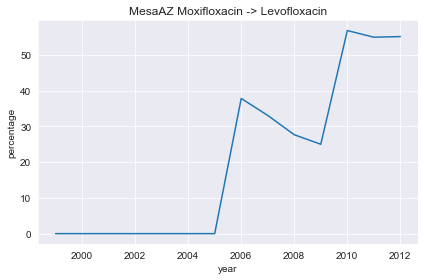

In [54]:
plotlinetmp('Moxifloxacin','Levofloxacin','MesaAZ')

In [44]:
def plotlinetmp2(drug1,drug2,region):
    percentData = pd.DataFrame(columns=['year','percentage'])
    for YEAR in range(1999,2013):
        StaphAureuaDataPath = 'splitData/{}{}.csv'.format(region,YEAR)
        
        try:
            StaphAureuaData = pd.read_csv(StaphAureuaDataPath)
        except OSError as e:
            df2 = {'year': YEAR, 'percentage': 0}
            percentData = percentData.append(df2, ignore_index = True)
            continue
        
        yearData = StaphAureuaData.loc[ ( ((StaphAureuaData[drug1] == 'R') |  (StaphAureuaData[drug1] == 'I')) & ((StaphAureuaData[drug2] == 'R') |  (StaphAureuaData[drug2] == 'I')) )  ]
        validData = StaphAureuaData.loc[ ( ((StaphAureuaData[drug1] == 'S') |(StaphAureuaData[drug1] == 'R') |  (StaphAureuaData[drug1] == 'I')) & ((StaphAureuaData[drug2] == 'S') |(StaphAureuaData[drug2] == 'R') |  (StaphAureuaData[drug2] == 'I')) )]
            
        try:
            percent = (len(yearData)/len(StaphAureuaData))*100
        except ZeroDivisionError as divError:
            percent = 0.0
        
        #percent=(len(yearData)/len(StaphAureuaData))*100
        df2 = {'year': YEAR, 'percentage': percent}
        percentData = percentData.append(df2, ignore_index = True)
    print(percentData)
    plt = sns.lineplot(data=percentData,x='year',y='percentage')
    plt.set_title('{} -> {}'.format(drug1,drug2))
    plt.legend(['Phoenix AZ','Mesa AZ'])
    fig = plt.figure
    fig.savefig('compare_{}_{}_{}_lineplot.png'.format(region,drug1.replace('/',''),drug2.replace('/','')),dpi=300)


      year  percentage
0   1999.0    0.000000
1   2000.0    5.017921
2   2001.0    5.647263
3   2002.0    9.000497
4   2003.0   10.510888
5   2004.0    9.337562
6   2005.0    7.966457
7   2006.0    0.000000
8   2007.0    0.366300
9   2008.0    1.123596
10  2009.0    1.619828
11  2010.0    2.164227
12  2011.0    2.232893
13  2012.0    1.843318
      year  percentage
0   1999.0    0.000000
1   2000.0    7.446809
2   2001.0    7.704655
3   2002.0    7.358871
4   2003.0    8.523726
5   2004.0    8.122867
6   2005.0    7.773852
7   2006.0    0.000000
8   2007.0    0.000000
9   2008.0    0.939728
10  2009.0    5.399432
11  2010.0    1.875853
12  2011.0    2.507837
13  2012.0    1.167031


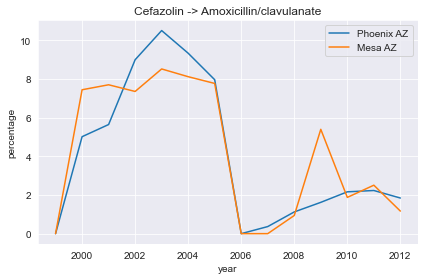

In [45]:
plotlinetmp2('Cefazolin','Amoxicillin/clavulanate','PhoenixAZ')
plotlinetmp2('Cefazolin','Amoxicillin/clavulanate','MesaAZ')

      year  percentage
0   1999.0    0.000000
1   2000.0    5.017921
2   2001.0    5.647263
3   2002.0    9.000497
4   2003.0   10.510888
5   2004.0    9.231853
6   2005.0    7.966457
7   2006.0    0.000000
8   2007.0    0.366300
9   2008.0    1.123596
10  2009.0    1.619828
11  2010.0    2.164227
12  2011.0    2.232893
13  2012.0    1.843318
      year  percentage
0   1999.0    0.000000
1   2000.0    7.446809
2   2001.0    7.704655
3   2002.0    7.358871
4   2003.0    8.523726
5   2004.0    7.918089
6   2005.0    7.773852
7   2006.0    0.000000
8   2007.0    0.000000
9   2008.0    0.972132
10  2009.0    5.399432
11  2010.0    1.944065
12  2011.0    2.507837
13  2012.0    1.167031


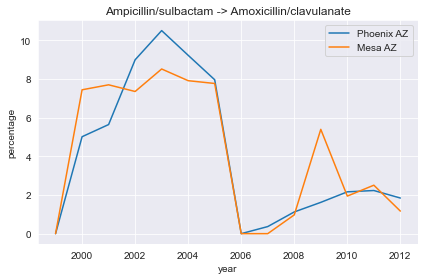

In [46]:
plotlinetmp2('Ampicillin/sulbactam','Amoxicillin/clavulanate','PhoenixAZ')
plotlinetmp2('Ampicillin/sulbactam','Amoxicillin/clavulanate','MesaAZ')

      year  percentage
0   1999.0    4.331307
1   2000.0    6.021505
2   2001.0    5.386620
3   2002.0    8.453506
4   2003.0    9.589615
5   2004.0    8.668076
6   2005.0    7.651992
7   2006.0    0.000000
8   2007.0    0.268620
9   2008.0    0.669376
10  2009.0    0.292740
11  2010.0    0.509230
12  2011.0    0.720288
13  2012.0    0.102407
      year  percentage
0   1999.0    3.655914
1   2000.0    7.902736
2   2001.0    7.223114
3   2002.0    6.955645
4   2003.0    8.260105
5   2004.0    7.713311
6   2005.0    7.067138
7   2006.0    0.000000
8   2007.0    0.000000
9   2008.0    0.000000
10  2009.0    0.000000
11  2010.0    0.000000
12  2011.0    0.000000
13  2012.0    0.000000


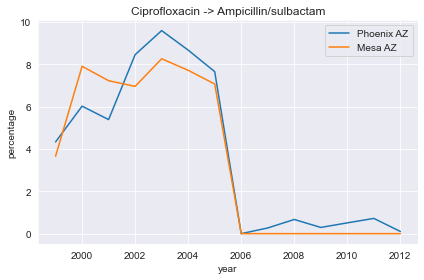

In [47]:
plotlinetmp2('Ciprofloxacin','Ampicillin/sulbactam','PhoenixAZ')
plotlinetmp2('Ciprofloxacin','Ampicillin/sulbactam','MesaAZ')

      year  percentage
0   1999.0    0.000000
1   2000.0    4.802867
2   2001.0    5.299739
3   2002.0    8.453506
4   2003.0    9.589615
5   2004.0    8.773784
6   2005.0    7.651992
7   2006.0    0.000000
8   2007.0    0.195360
9   2008.0    0.239063
10  2009.0    0.292740
11  2010.0    0.509230
12  2011.0    0.720288
13  2012.0    0.102407
      year  percentage
0   1999.0    0.000000
1   2000.0    7.294833
2   2001.0    7.223114
3   2002.0    6.955645
4   2003.0    8.260105
5   2004.0    7.918089
6   2005.0    7.067138
7   2006.0    0.000000
8   2007.0    0.000000
9   2008.0    0.000000
10  2009.0    0.000000
11  2010.0    0.000000
12  2011.0    0.000000
13  2012.0    0.000000


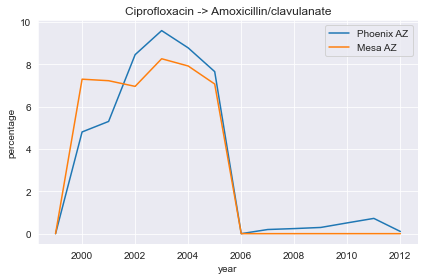

In [49]:
plotlinetmp2('Ciprofloxacin','Amoxicillin/clavulanate','PhoenixAZ')
plotlinetmp2('Ciprofloxacin','Amoxicillin/clavulanate','MesaAZ')

      year  percentage
0   1999.0    0.000000
1   2000.0    0.000000
2   2001.0    0.000000
3   2002.0    0.000000
4   2003.0    0.000000
5   2004.0    0.000000
6   2005.0    0.000000
7   2006.0    0.000000
8   2007.0    0.000000
9   2008.0    0.478126
10  2009.0    0.917252
11  2010.0    1.018460
12  2011.0    0.960384
13  2012.0    0.972862
      year  percentage
0   1999.0         0.0
1   2000.0         0.0
2   2001.0         0.0
3   2002.0         0.0
4   2003.0         0.0
5   2004.0         0.0
6   2005.0         0.0
7   2006.0         0.0
8   2007.0         0.0
9   2008.0         0.0
10  2009.0         0.0
11  2010.0         0.0
12  2011.0         0.0
13  2012.0         0.0


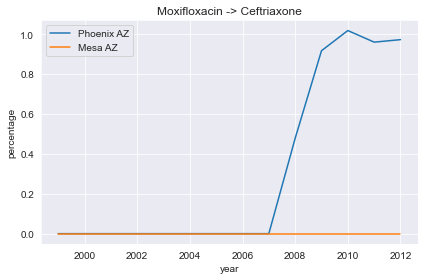

In [48]:
plotlinetmp2('Moxifloxacin','Ceftriaxone','PhoenixAZ')
plotlinetmp2('Moxifloxacin','Ceftriaxone','MesaAZ')

In [ ]:
plotlinetmp2('Ciprofloxacin','Cefazolin','PhoenixAZ') #5->4
plotlinetmp2('Ciprofloxacin','Cefazolin','MesaAZ') #5->4

      year  percentage
0   1999.0    0.000000
1   2000.0    5.017921
2   2001.0    5.647263
3   2002.0    9.000497
4   2003.0   10.510888
5   2004.0    9.231853
6   2005.0    7.966457
7   2006.0    0.000000
8   2007.0    0.366300
9   2008.0    1.123596
10  2009.0    1.619828
11  2010.0    2.164227
12  2011.0    2.232893
13  2012.0    1.843318
      year  percentage
0   1999.0    0.000000
1   2000.0    7.446809
2   2001.0    7.704655
3   2002.0    7.358871
4   2003.0    8.523726
5   2004.0    7.918089
6   2005.0    7.773852
7   2006.0    0.000000
8   2007.0    0.000000
9   2008.0    0.972132
10  2009.0    5.399432
11  2010.0    1.944065
12  2011.0    2.507837
13  2012.0    1.167031


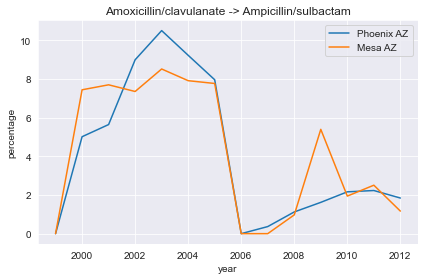

In [10]:
plotlinetmp2('Amoxicillin/clavulanate','Ampicillin/sulbactam','PhoenixAZ') #1->3
plotlinetmp2('Amoxicillin/clavulanate','Ampicillin/sulbactam','MesaAZ')

      year  percentage
0   1999.0   20.440729
1   2000.0   28.028674
2   2001.0   30.929626
3   2002.0   31.775236
4   2003.0   32.872697
5   2004.0   31.501057
6   2005.0   28.930818
7   2006.0   17.759237
8   2007.0   18.217338
9   2008.0   19.698781
10  2009.0   18.266979
11  2010.0   13.452154
12  2011.0   13.013205
13  2012.0   14.592934
      year  percentage
0   1999.0   18.064516
1   2000.0   28.267477
2   2001.0   31.942215
3   2002.0   29.737903
4   2003.0   28.558875
5   2004.0   32.969283
6   2005.0   32.862191
7   2006.0   20.536398
8   2007.0   21.813570
9   2008.0   20.511990
10  2009.0   18.061257
11  2010.0   12.278308
12  2011.0   13.270637
13  2012.0   14.514953


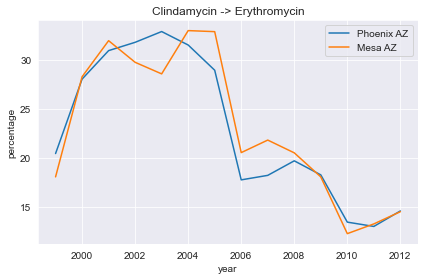

In [15]:
plotlinetmp2('Clindamycin','Erythromycin','PhoenixAZ') #8 -> 9
plotlinetmp2('Clindamycin','Erythromycin','MesaAZ') #8 -> 9

      year  percentage
0   1999.0   18.617021
1   2000.0    3.870968
2   2001.0    0.000000
3   2002.0    0.099453
4   2003.0    0.000000
5   2004.0    0.070472
6   2005.0    0.000000
7   2006.0    0.000000
8   2007.0    0.366300
9   2008.0    2.844848
10  2009.0    2.185792
11  2010.0    2.949289
12  2011.0    2.472989
13  2012.0    2.508961
      year  percentage
0   1999.0   16.774194
1   2000.0    4.255319
2   2001.0    0.160514
3   2002.0    0.000000
4   2003.0    0.000000
5   2004.0    0.000000
6   2005.0    0.000000
7   2006.0    0.000000
8   2007.0    0.000000
9   2008.0    0.874919
10  2009.0    5.273129
11  2010.0    1.773533
12  2011.0    2.368513
13  2012.0    1.167031


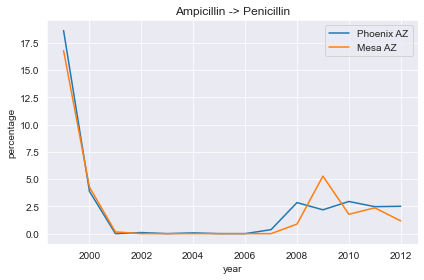

In [18]:
plotlinetmp2('Ampicillin','Penicillin','PhoenixAZ')#2 -> 16
plotlinetmp2('Ampicillin','Penicillin','MesaAZ')#2 -> 16

      year  percentage
0   1999.0   17.857143
1   2000.0   25.017921
2   2001.0   28.410078
3   2002.0   30.730980
4   2003.0   39.070352
5   2004.0   44.820296
6   2005.0   50.524109
7   2006.0   56.853397
8   2007.0   55.604396
9   2008.0   53.024145
10  2009.0   42.954723
11  2010.0   45.830681
12  2011.0   41.704682
13  2012.0   42.805940
      year  percentage
0   1999.0   15.483871
1   2000.0   22.796353
2   2001.0   28.250401
3   2002.0   28.830645
4   2003.0   36.994728
5   2004.0   41.228669
6   2005.0   49.823322
7   2006.0   58.084291
8   2007.0   54.248573
9   2008.0   53.532080
10  2009.0   45.374171
11  2010.0   48.601637
12  2011.0   47.056775
13  2012.0   46.608315


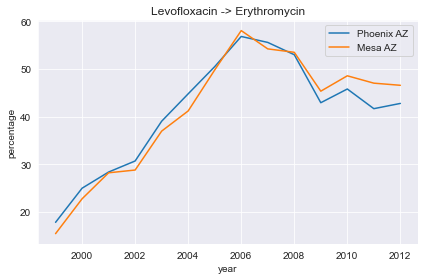

In [22]:
plotlinetmp2('Levofloxacin','Erythromycin','PhoenixAZ')
plotlinetmp2('Levofloxacin','Erythromycin','MesaAZ')

      year  percentage
0   1999.0   17.401216
1   2000.0   24.802867
2   2001.0   27.801911
3   2002.0   28.294381
4   2003.0   28.056951
5   2004.0   24.982382
6   2005.0   21.069182
7   2006.0   17.342074
8   2007.0   16.727717
9   2008.0   15.873775
10  2009.0   12.021858
11  2010.0    9.739020
12  2011.0    9.507803
13  2012.0   11.162314
      year  percentage
0   1999.0   13.978495
1   2000.0   22.340426
2   2001.0   29.052970
3   2002.0   26.209677
4   2003.0   26.625659
5   2004.0   26.211604
6   2005.0   28.975265
7   2006.0   19.923372
8   2007.0   18.516170
9   2008.0   16.623461
10  2009.0   12.282918
11  2010.0   10.607094
12  2011.0   11.633577
13  2012.0   13.056163


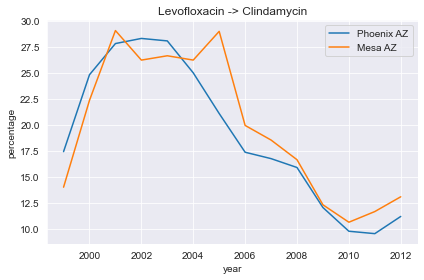

In [23]:
plotlinetmp2('Levofloxacin','Clindamycin','PhoenixAZ')
plotlinetmp2('Levofloxacin','Clindamycin','MesaAZ')

In [31]:
def plotlinetmp2(drug1,drug2,region):
    percentData = pd.DataFrame(columns=['year','percentage'])
    for YEAR in range(1999,2013):
        StaphAureuaDataPath = 'splitData/{}{}.csv'.format(region,YEAR)
        
        try:
            StaphAureuaData = pd.read_csv(StaphAureuaDataPath)
        except OSError as e:
            df2 = {'year': YEAR, 'percentage': 0}
            percentData = percentData.append(df2, ignore_index = True)
            continue
        
        yearData = StaphAureuaData.loc[ ( ((StaphAureuaData[drug1] == 'R') |  (StaphAureuaData[drug1] == 'I')) & ((StaphAureuaData[drug2] == 'R') |  (StaphAureuaData[drug2] == 'I')) )  ]
        validData = StaphAureuaData.loc[ ( ((StaphAureuaData[drug1] == 'S') |(StaphAureuaData[drug1] == 'R') |  (StaphAureuaData[drug1] == 'I')) & ((StaphAureuaData[drug2] == 'S') |(StaphAureuaData[drug2] == 'R') |  (StaphAureuaData[drug2] == 'I')) )]
            
        try:
            percent = (len(yearData)/len(StaphAureuaData))*100
        except ZeroDivisionError as divError:
            percent = 0.0
        
        #percent=(len(yearData)/len(StaphAureuaData))*100
        df2 = {'year': YEAR, 'percentage': percent}
        percentData = percentData.append(df2, ignore_index = True)
    print(percentData)
    plt = sns.lineplot(data=percentData,x='year',y='percentage')
    plt.set_title('{} -> {}'.format(drug1,drug2))
    plt.legend(['Manhattan NY','White Plains NY','Port Chester NY','Newark NJ','Ridgewood NJ','Hackensack NJ'])
    fig = plt.figure
    fig.savefig('compare_{}_{}_{}_lineplot.png'.format(region,drug1.replace('/',''),drug2.replace('/','')),dpi=300)


      year  percentage
0   1999.0   50.000000
1   2000.0   15.668203
2   2001.0   14.463316
3   2002.0   12.475665
4   2003.0    7.986309
5   2004.0    0.218436
6   2005.0    0.037608
7   2006.0    0.115340
8   2007.0    0.052411
9   2008.0    0.064599
10  2009.0    0.136426
11  2010.0    0.000000
12  2011.0    0.000000
13  2012.0    0.000000
      year  percentage
0   1999.0    0.000000
1   2000.0    0.000000
2   2001.0    0.000000
3   2002.0   13.353116
4   2003.0   35.674931
5   2004.0   50.984936
6   2005.0   48.777648
7   2006.0   49.844560
8   2007.0   46.428571
9   2008.0    9.921355
10  2009.0    0.000000
11  2010.0    0.064641
12  2011.0   32.386800
13  2012.0   36.933333
      year percentage
0     1999          0
1     2000          0
2     2001          0
3     2002          0
4   2003.0       60.0
5   2004.0  59.090909
6   2005.0       64.0
7   2006.0  63.636364
8   2007.0      100.0
9   2008.0  40.740741
10  2009.0        0.0
11  2010.0        0.0
12  2011.0  27.272727
13

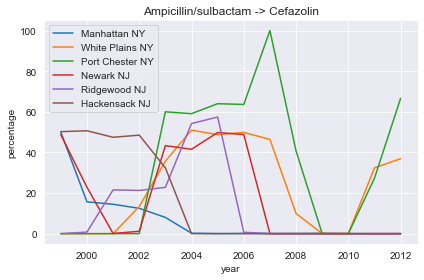

In [32]:
plotlinetmp2('Ampicillin/sulbactam','Cefazolin','ManhattanNY')
plotlinetmp2('Ampicillin/sulbactam','Cefazolin','WhitePlainsNY')
plotlinetmp2('Ampicillin/sulbactam','Cefazolin','PortChesterNY')
plotlinetmp2('Ampicillin/sulbactam','Cefazolin','NewarkNJ')
plotlinetmp2('Ampicillin/sulbactam','Cefazolin','RidgewoodNJ')
plotlinetmp2('Ampicillin/sulbactam','Cefazolin','HackensackNJ')

      year  percentage
0   1999.0   50.441362
1   2000.0   15.628131
2   2001.0   26.160042
3   2002.0   30.921480
4   2003.0    8.176459
5   2004.0    0.000000
6   2005.0    0.000000
7   2006.0    0.000000
8   2007.0    0.000000
9   2008.0    0.043066
10  2009.0    0.204638
11  2010.0    0.000000
12  2011.0    0.000000
13  2012.0    0.000000
      year  percentage
0   1999.0   57.014028
1   2000.0   54.681648
2   2001.0   50.062267
3   2002.0   50.049456
4   2003.0    9.504132
5   2004.0    0.000000
6   2005.0    0.000000
7   2006.0    0.000000
8   2007.0    0.000000
9   2008.0   26.194797
10  2009.0   42.142026
11  2010.0   43.891403
12  2011.0   40.521873
13  2012.0   36.800000
      year percentage
0     1999          0
1     2000          0
2     2001          0
3     2002          0
4   2003.0        0.0
5   2004.0        0.0
6   2005.0        0.0
7   2006.0        0.0
8   2007.0        0.0
9   2008.0  22.222222
10  2009.0   54.83871
11  2010.0       87.5
12  2011.0  81.818182
13

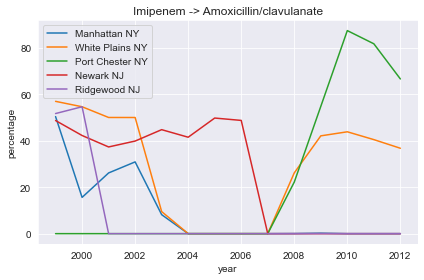

In [35]:
#'Imipenem' -> 'Amoxicillin/clavulanate'
plotlinetmp2('Imipenem','Amoxicillin/clavulanate','ManhattanNY')
plotlinetmp2('Imipenem','Amoxicillin/clavulanate','WhitePlainsNY')
plotlinetmp2('Imipenem','Amoxicillin/clavulanate','PortChesterNY')
plotlinetmp2('Imipenem','Amoxicillin/clavulanate','NewarkNJ')
plotlinetmp2('Imipenem','Amoxicillin/clavulanate','RidgewoodNJ')

In [10]:
def plotlinetmp2(drug1,drug2,region):
    percentData = pd.DataFrame(columns=['year','percentage'])
    for YEAR in range(1999,2013):
        StaphAureuaDataPath = 'splitData/{}{}.csv'.format(region,YEAR)
        
        try:
            StaphAureuaData = pd.read_csv(StaphAureuaDataPath)
        except OSError as e:
            df2 = {'year': YEAR, 'percentage': 0}
            percentData = percentData.append(df2, ignore_index = True)
            continue
        
        yearData = StaphAureuaData.loc[ ( ((StaphAureuaData[drug1] == 'R') |  (StaphAureuaData[drug1] == 'I')) & ((StaphAureuaData[drug2] == 'R') |  (StaphAureuaData[drug2] == 'I')) )  ]
        validData = StaphAureuaData.loc[ ( ((StaphAureuaData[drug1] == 'S') |(StaphAureuaData[drug1] == 'R') |  (StaphAureuaData[drug1] == 'I')) & ((StaphAureuaData[drug2] == 'S') |(StaphAureuaData[drug2] == 'R') |  (StaphAureuaData[drug2] == 'I')) )]
            
        try:
            percent = (len(yearData)/len(StaphAureuaData))*100
        except ZeroDivisionError as divError:
            percent = 0.0
        
        #percent=(len(yearData)/len(StaphAureuaData))*100
        df2 = {'year': YEAR, 'percentage': percent}
        percentData = percentData.append(df2, ignore_index = True)
    print(percentData)
    plt = sns.lineplot(data=percentData,x='year',y='percentage')
    plt.set_title('{} -> {}'.format(drug1,drug2))
    plt.legend(['Albuquerque NM','Denver CO','El Paso TX'])
    fig = plt.figure
    fig.savefig('compare_{}_{}_{}_lineplot.png'.format(region,drug1.replace('/',''),drug2.replace('/','')),dpi=300)


      year  percentage
0   1999.0   16.122651
1   2000.0   12.420179
2   2001.0   13.343328
3   2002.0   17.008527
4   2003.0   34.372983
5   2004.0   43.597348
6   2005.0   44.808405
7   2006.0   47.309691
8   2007.0   31.746527
9   2008.0    0.000000
10  2009.0    0.000000
11  2010.0    0.013982
12  2011.0    0.000000
13  2012.0    0.000000
      year  percentage
0   1999.0   37.160752
1   2000.0   45.277507
2   2001.0   49.555556
3   2002.0   50.729927
4   2003.0   55.359566
5   2004.0   52.077151
6   2005.0   59.246575
7   2006.0    0.000000
8   2007.0    0.000000
9   2008.0    0.000000
10  2009.0    0.000000
11  2010.0    0.000000
12  2011.0    0.000000
13  2012.0    0.000000


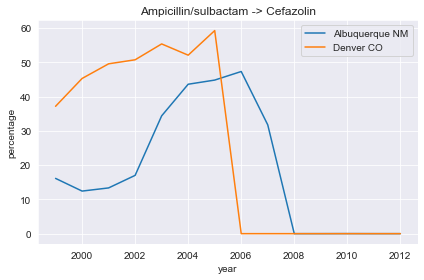

In [39]:
plotlinetmp2('Ampicillin/sulbactam','Cefazolin','AlbuquerqueNM')
plotlinetmp2('Ampicillin/sulbactam','Cefazolin','DenverCO')
#plotlinetmp2('Ampicillin/sulbactam','Cefazolin','ElPasoTX')

      year  percentage
0   1999.0   20.425321
1   2000.0   10.472542
2   2001.0    6.946527
3   2002.0   10.071445
4   2003.0    9.292321
5   2004.0   10.397767
6   2005.0   17.799753
7   2006.0    6.817487
8   2007.0    0.015608
9   2008.0    0.000000
10  2009.0    0.000000
11  2010.0    0.000000
12  2011.0    0.000000
13  2012.0    0.000000
      year  percentage
0   1999.0   36.847599
1   2000.0   43.914314
2   2001.0   48.333333
3   2002.0   49.726277
4   2003.0   55.359566
5   2004.0   52.077151
6   2005.0   59.246575
7   2006.0    0.000000
8   2007.0    0.000000
9   2008.0    0.000000
10  2009.0    0.000000
11  2010.0    0.000000
12  2011.0    0.000000
13  2012.0    0.000000
      year  percentage
0   1999.0   12.652068
1   2000.0   20.797721
2   2001.0   24.050633
3   2002.0   28.459530
4   2003.0    0.000000
5   2004.0    0.000000
6   2005.0    0.000000
7   2006.0    0.000000
8   2007.0    0.000000
9   2008.0    0.000000
10  2009.0    0.000000
11  2010.0    0.000000
12  2011.0 

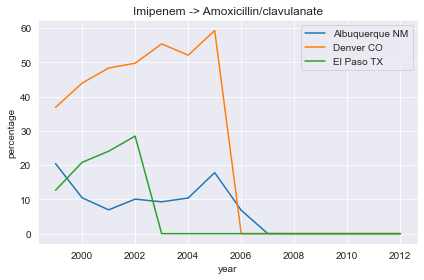

In [41]:
plotlinetmp2('Imipenem','Amoxicillin/clavulanate','AlbuquerqueNM')
plotlinetmp2('Imipenem','Amoxicillin/clavulanate','DenverCO')
plotlinetmp2('Imipenem','Amoxicillin/clavulanate','ElPasoTX')

      year  percentage
0   1999.0   27.546983
1   2000.0   17.720307
2   2001.0   17.766117
3   2002.0   18.667896
4   2003.0   13.121101
5   2004.0   13.886950
6   2005.0   11.665637
7   2006.0   10.027515
8   2007.0    8.319026
9   2008.0    9.648913
10  2009.0    8.720930
11  2010.0    8.794743
12  2011.0    8.642718
13  2012.0    9.192922
      year  percentage
0   1999.0   31.732777
1   2000.0   41.674781
2   2001.0   45.444444
3   2002.0   44.251825
4   2003.0   31.478969
5   2004.0   30.563798
6   2005.0   32.534247
7   2006.0    0.000000
8   2007.0    0.000000
9   2008.0    0.000000
10  2009.0    0.000000
11  2010.0    0.000000
12  2011.0    0.000000
13  2012.0    0.000000
      year  percentage
0   1999.0    7.299270
1   2000.0    9.401709
2   2001.0   13.502110
3   2002.0   15.143603
4   2003.0    0.000000
5   2004.0    0.000000
6   2005.0    0.000000
7   2006.0    0.000000
8   2007.0    0.000000
9   2008.0    0.000000
10  2009.0    0.000000
11  2010.0    0.000000
12  2011.0 

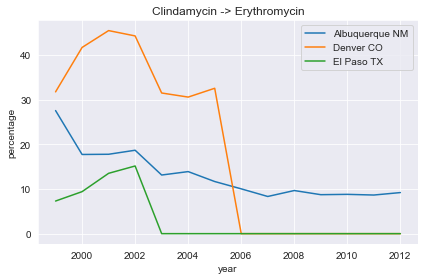

In [42]:
#Clindamycin -> Erythromycin
plotlinetmp2('Clindamycin','Erythromycin','AlbuquerqueNM')
plotlinetmp2('Clindamycin','Erythromycin','DenverCO')
plotlinetmp2('Clindamycin','Erythromycin','ElPasoTX')

      year  percentage
0   1999.0    9.693373
1   2000.0    7.950192
2   2001.0   20.239880
3   2002.0   22.701083
4   2003.0   26.005593
5   2004.0   25.052338
6   2005.0    0.339926
7   2006.0    1.085295
8   2007.0    4.323396
9   2008.0    0.000000
10  2009.0    0.000000
11  2010.0    0.671141
12  2011.0    0.992034
13  2012.0    0.949504
      year  percentage
0   1999.0    7.306889
1   2000.0   49.464460
2   2001.0   52.888889
3   2002.0   56.204380
4   2003.0   59.294437
5   2004.0   55.934718
6   2005.0   61.301370
7   2006.0    0.000000
8   2007.0    0.000000
9   2008.0    0.000000
10  2009.0    0.000000
11  2010.0    0.000000
12  2011.0    0.000000
13  2012.0    0.000000
      year  percentage
0   1999.0    9.732360
1   2000.0   16.239316
2   2001.0   22.362869
3   2002.0   21.671018
4   2003.0    0.000000
5   2004.0    0.000000
6   2005.0    0.000000
7   2006.0    0.000000
8   2007.0    0.000000
9   2008.0    0.000000
10  2009.0    0.000000
11  2010.0    0.000000
12  2011.0 

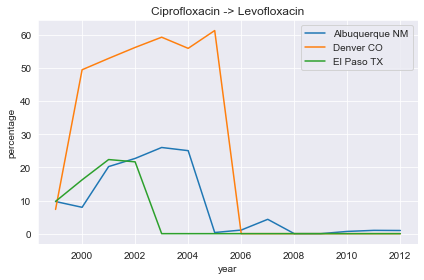

In [43]:
#Ciprofloxacin -> Levofloxacin
plotlinetmp2('Ciprofloxacin','Levofloxacin','AlbuquerqueNM')
plotlinetmp2('Ciprofloxacin','Levofloxacin','DenverCO')
plotlinetmp2('Ciprofloxacin','Levofloxacin','ElPasoTX')

In [8]:
def plotlinetmp2(drug1,drug2,region):
    percentData = pd.DataFrame(columns=['year','percentage'])
    for YEAR in range(1999,2013):
        StaphAureuaDataPath = 'splitData/{}{}.csv'.format(region,YEAR)
        
        try:
            StaphAureuaData = pd.read_csv(StaphAureuaDataPath)
        except OSError as e:
            df2 = {'year': YEAR, 'percentage': 0}
            percentData = percentData.append(df2, ignore_index = True)
            continue
        
        yearData = StaphAureuaData.loc[ ( ((StaphAureuaData[drug1] == 'R') |  (StaphAureuaData[drug1] == 'I')) & ((StaphAureuaData[drug2] == 'R') |  (StaphAureuaData[drug2] == 'I')) )  ]
        validData = StaphAureuaData.loc[ ( ((StaphAureuaData[drug1] == 'S') |(StaphAureuaData[drug1] == 'R') |  (StaphAureuaData[drug1] == 'I')) & ((StaphAureuaData[drug2] == 'S') |(StaphAureuaData[drug2] == 'R') |  (StaphAureuaData[drug2] == 'I')) )]
            
        try:
            percent = (len(yearData)/len(StaphAureuaData))*100
        except ZeroDivisionError as divError:
            percent = 0.0
        
        #percent=(len(yearData)/len(StaphAureuaData))*100
        df2 = {'year': YEAR, 'percentage': percent}
        percentData = percentData.append(df2, ignore_index = True)
    print(percentData)
    plt = sns.lineplot(data=percentData,x='year',y='percentage')
    plt.set_title('{} -> {}'.format(drug1,drug2))
    plt.legend(['Dallas TX','San Antonio TX','Houston TX'])
    fig = plt.figure
    fig.savefig('compare_{}_{}_{}_lineplot.png'.format(region,drug1.replace('/',''),drug2.replace('/','')),dpi=300)


      year  percentage
0   1999.0   34.214047
1   2000.0   37.355111
2   2001.0   32.669323
3   2002.0   35.524316
4   2003.0   28.430788
5   2004.0   28.256975
6   2005.0   27.707006
7   2006.0   26.637250
8   2007.0   25.210658
9   2008.0   18.262702
10  2009.0   18.461944
11  2010.0   20.396947
12  2011.0   19.003322
13  2012.0   19.200000
      year  percentage
0   1999.0   23.282561
1   2000.0   31.695878
2   2001.0   29.641026
3   2002.0   28.017241
4   2003.0   24.870863
5   2004.0   26.653249
6   2005.0   27.777778
7   2006.0   31.736057
8   2007.0   23.577236
9   2008.0   20.716612
10  2009.0   21.698984
11  2010.0   22.842640
12  2011.0    0.000000
13  2012.0    0.000000
      year  percentage
0   1999.0   39.504618
1   2000.0   37.505358
2   2001.0   34.503632
3   2002.0   34.362216
4   2003.0   33.380631
5   2004.0   36.056338
6   2005.0   35.612666
7   2006.0   35.113122
8   2007.0   34.225621
9   2008.0   35.076748
10  2009.0   31.062500
11  2010.0   28.981164
12  2011.0 

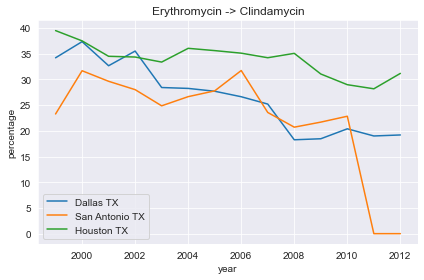

In [54]:
plotlinetmp2('Erythromycin','Clindamycin','DallasTX')
plotlinetmp2('Erythromycin','Clindamycin','SanAntonioTX')
plotlinetmp2('Erythromycin','Clindamycin','HoustonTX')

      year  percentage
0   1999.0   28.628763
1   2000.0   38.988409
2   2001.0   35.913489
3   2002.0   21.428571
4   2003.0   13.394988
5   2004.0    5.656514
6   2005.0    8.030027
7   2006.0    6.874129
8   2007.0    8.494648
9   2008.0   16.717396
10  2009.0   10.113247
11  2010.0    4.732824
12  2011.0    0.000000
13  2012.0    0.000000
      year  percentage
0   1999.0    0.000000
1   2000.0    0.024685
2   2001.0    0.000000
3   2002.0    2.442529
4   2003.0   21.293285
5   2004.0    0.086256
6   2005.0    0.182149
7   2006.0    0.235664
8   2007.0   30.650407
9   2008.0   35.635179
10  2009.0   34.533703
11  2010.0   35.152284
12  2011.0   66.666667
13  2012.0    0.000000


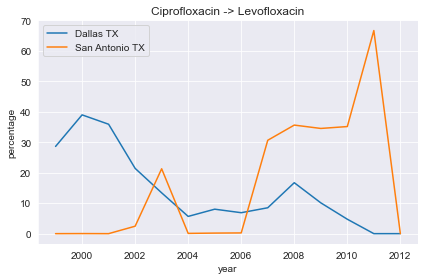

In [56]:
plotlinetmp2('Ciprofloxacin','Levofloxacin','DallasTX')
plotlinetmp2('Ciprofloxacin','Levofloxacin','SanAntonioTX')
# plotlinetmp2('Ciprofloxacin','Levofloxacin','HoustonTX')

      year  percentage
0   1999.0   24.548495
1   2000.0   35.247629
2   2001.0   33.921457
3   2002.0   35.790274
4   2003.0   36.247017
5   2004.0   37.036089
6   2005.0   38.739763
7   2006.0   40.478402
8   2007.0   40.264177
9   2008.0   31.210489
10  2009.0   18.514617
11  2010.0   19.511450
12  2011.0   28.239203
13  2012.0   32.800000
      year  percentage
0   1999.0    0.031085
1   2000.0   22.710442
2   2001.0   33.230769
3   2002.0   31.096059
4   2003.0   18.672279
5   2004.0    0.345026
6   2005.0    0.182149
7   2006.0    0.157109
8   2007.0   25.447154
9   2008.0   31.335505
10  2009.0   27.885503
11  2010.0   29.187817
12  2011.0    0.000000
13  2012.0    0.000000
      year  percentage
0   1999.0    0.000000
1   2000.0    0.000000
2   2001.0    0.000000
3   2002.0    0.000000
4   2003.0    0.000000
5   2004.0   17.062374
6   2005.0   44.653511
7   2006.0   45.746606
8   2007.0   44.598470
9   2008.0   44.229676
10  2009.0   38.875000
11  2010.0   41.738014
12  2011.0 

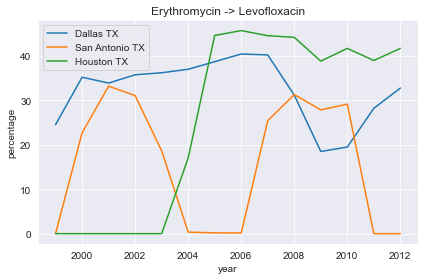

In [57]:
#Levofloxacin -> Erythromycin
plotlinetmp2('Erythromycin','Levofloxacin','DallasTX')
plotlinetmp2('Erythromycin','Levofloxacin','SanAntonioTX')
plotlinetmp2('Erythromycin','Levofloxacin','HoustonTX')

      year  percentage
0   1999.0    0.741840
1   2000.0    0.766284
2   2001.0    0.000000
3   2002.0    2.166398
4   2003.0   16.713272
5   2004.0   17.079553
6   2005.0   18.495056
7   2006.0    6.878630
8   2007.0    0.015608
9   2008.0    0.000000
10  2009.0    0.000000
11  2010.0    0.000000
12  2011.0    0.000000
13  2012.0    0.000000
      year  percentage
0   1999.0   37.056367
1   2000.0   43.719572
2   2001.0   48.333333
3   2002.0   49.726277
4   2003.0   55.359566
5   2004.0   52.077151
6   2005.0   59.246575
7   2006.0    0.000000
8   2007.0    0.000000
9   2008.0    0.000000
10  2009.0    0.000000
11  2010.0    0.000000
12  2011.0    0.000000
13  2012.0    0.000000
      year  percentage
0   1999.0         0.0
1   2000.0         0.0
2   2001.0         0.0
3   2002.0         0.0
4   2003.0         0.0
5   2004.0         0.0
6   2005.0         0.0
7   2006.0         0.0
8   2007.0         0.0
9   2008.0         0.0
10  2009.0         0.0
11  2010.0         0.0
12  2011.0 

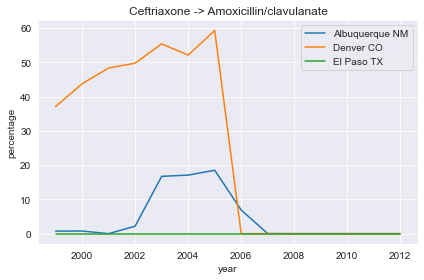

In [11]:
plotlinetmp2('Ceftriaxone','Amoxicillin/clavulanate','AlbuquerqueNM') #5 -> 1
plotlinetmp2('Ceftriaxone','Amoxicillin/clavulanate','DenverCO') #5 -> 1
plotlinetmp2('Ceftriaxone','Amoxicillin/clavulanate','ElPasoTX') #5 -> 1

      year  percentage
0   1999.0   20.425321
1   2000.0   10.472542
2   2001.0    6.946527
3   2002.0   10.071445
4   2003.0    9.292321
5   2004.0   10.397767
6   2005.0   17.799753
7   2006.0    6.817487
8   2007.0    0.015608
9   2008.0    0.000000
10  2009.0    0.000000
11  2010.0    0.000000
12  2011.0    0.000000
13  2012.0    0.000000
      year  percentage
0   1999.0   36.847599
1   2000.0   43.914314
2   2001.0   48.333333
3   2002.0   49.726277
4   2003.0   55.359566
5   2004.0   52.077151
6   2005.0   59.246575
7   2006.0    0.000000
8   2007.0    0.000000
9   2008.0    0.000000
10  2009.0    0.000000
11  2010.0    0.000000
12  2011.0    0.000000
13  2012.0    0.000000
      year  percentage
0   1999.0   12.652068
1   2000.0   20.797721
2   2001.0   24.050633
3   2002.0   28.459530
4   2003.0    0.000000
5   2004.0    0.000000
6   2005.0    0.000000
7   2006.0    0.000000
8   2007.0    0.000000
9   2008.0    0.000000
10  2009.0    0.000000
11  2010.0    0.000000
12  2011.0 

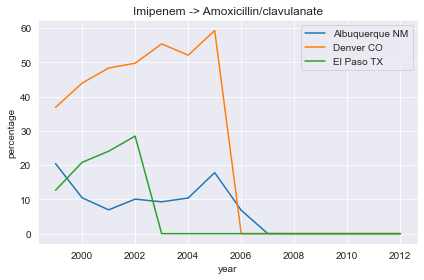

In [12]:
plotlinetmp2('Imipenem','Amoxicillin/clavulanate','AlbuquerqueNM') #5 -> 11
plotlinetmp2('Imipenem','Amoxicillin/clavulanate','DenverCO') #5 -> 11
plotlinetmp2('Imipenem','Amoxicillin/clavulanate','ElPasoTX') #5 -> 11

In [25]:
def plotlinetmpMRSA(region):
    
    percentData = pd.DataFrame(columns=['year','percentage'])
    for YEAR in range(1999,2013):
        StaphAureuaDataPath = 'splitData/{}{}.csv'.format(region.replace(' ',''),YEAR)
        
        try:
            StaphAureuaData = pd.read_csv(StaphAureuaDataPath)
        except OSError as e:
#             df2 = {'year': YEAR, 'percentage': 0}
#             percentData = percentData.append(df2, ignore_index = True)
            continue
        
        yearData = StaphAureuaData.loc[ ( ((StaphAureuaData['Oxacillin'] == 'R') |  (StaphAureuaData['Oxacillin'] == 'I')) )  ]
        validData = StaphAureuaData.loc[ ( ((StaphAureuaData['Oxacillin'] == 'S') |(StaphAureuaData['Oxacillin'] == 'R') |  (StaphAureuaData['Oxacillin'] == 'I'))  )]
            
        try:
            percent = (len(yearData)/len(StaphAureuaData))*100
        except ZeroDivisionError as divError:
            percent = 0.0
        
        #percent=(len(yearData)/len(StaphAureuaData))*100
        df2 = {'year': YEAR, 'percentage': percent}
        percentData = percentData.append(df2, ignore_index = True)
    print(percentData)
    plt = sns.lineplot(data=percentData,x='year',y='percentage')
    plt.set_title('{} MRSA'.format(region))
    plt.legend([region])
    fig = plt.figure
    fig.savefig('compare_{}_MRSA_lineplot.png'.format(region.replace(' ',''),dpi=300))


      year  percentage
0   1999.0   36.795252
1   2000.0   27.362708
2   2001.0   32.283858
3   2002.0   39.202581
4   2003.0   41.858464
5   2004.0   50.296581
6   2005.0   52.564895
7   2006.0   51.635585
8   2007.0   52.442641
9   2008.0   51.755433
10  2009.0   49.095607
11  2010.0   48.308166
12  2011.0   45.828949
13  2012.0   43.461372
      year  percentage
0   1999.0   24.924012
1   2000.0   35.268817
2   2001.0   40.747176
3   2002.0   48.383889
4   2003.0   59.170854
5   2004.0   65.362932
6   2005.0   70.020964
7   2006.0   70.321812
8   2007.0   66.275946
9   2008.0   63.614631
10  2009.0   58.957845
11  2010.0   60.555909
12  2011.0   54.957983
13  2012.0   55.965182


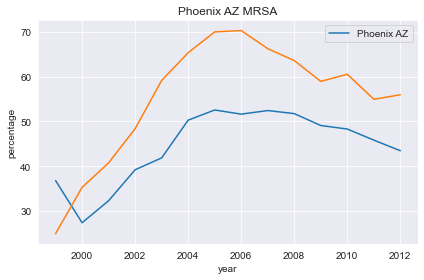

In [27]:
plotlinetmpMRSA('Albuquerque NM') #5 -> 11
plotlinetmpMRSA('Phoenix AZ') #5 -> 11

# plotlinetmp3('Imipenem','Amoxicillin/clavulanate','DenverCO') #5 -> 11
# plotlinetmp3('Imipenem','Amoxicillin/clavulanate','ElPasoTX') #5 -> 11

In [39]:
def plotlinetmpMRSAMSSA(region):
    
    percentData = pd.DataFrame(columns=['year','percentage'])
    for YEAR in range(1999,2013):
        StaphAureuaDataPath = 'splitData/{}{}.csv'.format(region.replace(' ',''),YEAR)
        
        try:
            StaphAureuaData = pd.read_csv(StaphAureuaDataPath)
        except OSError as e:
#             df2 = {'year': YEAR, 'percentage': 0}
#             percentData = percentData.append(df2, ignore_index = True)
            continue
        
        yearData = StaphAureuaData.loc[ ( ((StaphAureuaData['Oxacillin'] == 'R') |  (StaphAureuaData['Oxacillin'] == 'I')) )  ]
        validData = StaphAureuaData.loc[ ( ((StaphAureuaData['Oxacillin'] == 'S') |(StaphAureuaData['Oxacillin'] == 'R') |  (StaphAureuaData['Oxacillin'] == 'I'))  )]
            
        try:
            percent = (len(yearData)/len(StaphAureuaData))*100
        except ZeroDivisionError as divError:
            percent = 0.0
        
        #percent=(len(yearData)/len(StaphAureuaData))*100
        df2 = {'year': YEAR, 'percentage': percent}
        percentData = percentData.append(df2, ignore_index = True)
    print(percentData)
    plt = sns.lineplot(data=percentData,x='year',y='percentage')
    
    percentData = pd.DataFrame(columns=['year','percentage'])
    for YEAR in range(1999,2013):
        StaphAureuaDataPath = 'splitData/{}{}.csv'.format(region.replace(' ',''),YEAR)
        
        try:
            StaphAureuaData = pd.read_csv(StaphAureuaDataPath)
        except OSError as e:
#             df2 = {'year': YEAR, 'percentage': 0}
#             percentData = percentData.append(df2, ignore_index = True)
            continue
        
        yearData = StaphAureuaData.loc[ ( ((StaphAureuaData['Oxacillin'] == 'S')) )  ]
        validData = StaphAureuaData.loc[ ( ((StaphAureuaData['Oxacillin'] == 'S') |(StaphAureuaData['Oxacillin'] == 'R') |  (StaphAureuaData['Oxacillin'] == 'I'))  )]
            
        try:
            percent = (len(yearData)/len(StaphAureuaData))*100
        except ZeroDivisionError as divError:
            percent = 0.0
        
        #percent=(len(yearData)/len(StaphAureuaData))*100
        df2 = {'year': YEAR, 'percentage': percent}
        percentData = percentData.append(df2, ignore_index = True)
    print(percentData)
    plt = sns.lineplot(data=percentData,x='year',y='percentage')
    plt.set_title('{}'.format(region))
    plt.legend(['MRSA','MSSA'])
    fig = plt.figure
    fig.savefig('compare_{}_MRSA_MSSA_lineplot.png'.format(region.replace(' ',''),dpi=300))


      year  percentage
0   1999.0   36.795252
1   2000.0   27.362708
2   2001.0   32.283858
3   2002.0   39.202581
4   2003.0   41.858464
5   2004.0   50.296581
6   2005.0   52.564895
7   2006.0   51.635585
8   2007.0   52.442641
9   2008.0   51.755433
10  2009.0   49.095607
11  2010.0   48.308166
12  2011.0   45.828949
13  2012.0   43.461372
      year  percentage
0   1999.0   61.622156
1   2000.0   72.349936
2   2001.0   67.291354
3   2002.0   60.543904
4   2003.0   57.754356
5   2004.0   49.563852
6   2005.0   47.265142
7   2006.0   48.165699
8   2007.0   47.323240
9   2008.0   48.005732
10  2009.0   50.301464
11  2010.0   50.922819
12  2011.0   53.209079
13  2012.0   55.416487


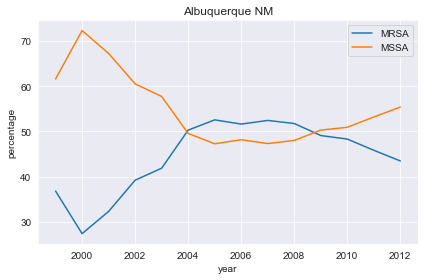

In [40]:
plotlinetmpMRSAMSSA('Albuquerque NM')

      year  percentage
0   1999.0   24.924012
1   2000.0   35.268817
2   2001.0   40.747176
3   2002.0   48.383889
4   2003.0   59.170854
5   2004.0   65.362932
6   2005.0   70.020964
7   2006.0   70.321812
8   2007.0   66.275946
9   2008.0   63.614631
10  2009.0   58.957845
11  2010.0   60.555909
12  2011.0   54.957983
13  2012.0   55.965182
      year  percentage
0   1999.0   74.924012
1   2000.0   63.799283
2   2001.0   59.079062
3   2002.0   51.019393
4   2003.0   40.577889
5   2004.0   34.214235
6   2005.0   29.454927
7   2006.0   29.499404
8   2007.0   33.235653
9   2008.0   36.122400
10  2009.0   40.573770
11  2010.0   38.892425
12  2011.0   44.585834
13  2012.0   43.420379


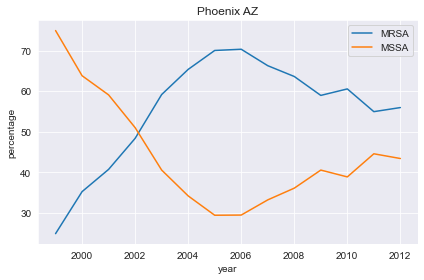

In [41]:
plotlinetmpMRSAMSSA('Phoenix AZ') #5 -> 11


     year  percentage
0  1999.0   12.652068
1  2000.0   20.797721
2  2001.0   24.050633
3  2002.0   28.459530
      year  percentage
0   1999.0   76.129032
1   2000.0   64.437690
2   2001.0   57.463884
3   2002.0   55.040323
4   2003.0   42.179262
5   2004.0   36.109215
6   2005.0   28.268551
7   2006.0   28.888889
8   2007.0   32.752061
9   2008.0   35.353208
10  2009.0   39.627408
11  2010.0   40.109141
12  2011.0   41.866945
13  2012.0   42.742524


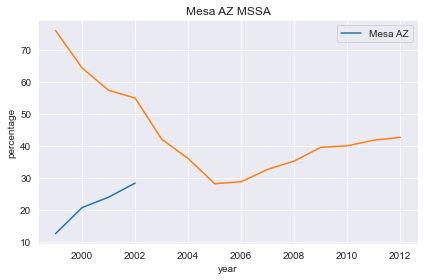

In [34]:
plotlinetmpMRSA('El Paso TX') #5 -> 11
plotlinetmpMSSA('Mesa AZ') #5 -> 11


In [ ]:
def plotlinetmpMSSA2(region):
    
    percentData = pd.DataFrame(columns=['year','percentage'])
    for YEAR in range(1999,2013):
        StaphAureuaDataPath = 'splitData/{}{}.csv'.format(region.replace(' ',''),YEAR)
        
        try:
            StaphAureuaData = pd.read_csv(StaphAureuaDataPath)
        except OSError as e:
#             df2 = {'year': YEAR, 'percentage': 0}
#             percentData = percentData.append(df2, ignore_index = True)
            continue
        
        yearData = StaphAureuaData.loc[ ( ((StaphAureuaData['Oxacillin'] == 'S')) )  ]
        validData = StaphAureuaData.loc[ ( ((StaphAureuaData['Oxacillin'] == 'S') |(StaphAureuaData['Oxacillin'] == 'R') |  (StaphAureuaData['Oxacillin'] == 'I'))  )]
            
        try:
            percent = (len(yearData)/len(StaphAureuaData))*100
        except ZeroDivisionError as divError:
            percent = 0.0
        
        #percent=(len(yearData)/len(StaphAureuaData))*100
        df2 = {'year': YEAR, 'percentage': percent}
        percentData = percentData.append(df2, ignore_index = True)
    print(percentData)
    plt = sns.lineplot(data=percentData,x='year',y='percentage')
    plt.set_title('{} MSSA'.format(region))
    plt.legend([region])
    fig = plt.figure
    fig.savefig('compare_{}_MSSA_lineplot.png'.format(region.replace(' ',''),dpi=300))


In [ ]:
plotlinetmpMSSA('Albuquerque NM') #5 -> 11
plotlinetmpMRSA('Albuquerque NM') #5 -> 11

In [44]:
def plotlinetmpMRSAMSSA_dual(mrsaregion,mssaregion):
    
    percentData = pd.DataFrame(columns=['year','percentage'])
    for YEAR in range(1999,2013):
        StaphAureuaDataPath = 'splitData/{}{}.csv'.format(mrsaregion.replace(' ',''),YEAR)
        
        try:
            StaphAureuaData = pd.read_csv(StaphAureuaDataPath)
        except OSError as e:
#             df2 = {'year': YEAR, 'percentage': 0}
#             percentData = percentData.append(df2, ignore_index = True)
            continue
        
        yearData = StaphAureuaData.loc[ ( ((StaphAureuaData['Oxacillin'] == 'R') |  (StaphAureuaData['Oxacillin'] == 'I')) )  ]
        validData = StaphAureuaData.loc[ ( ((StaphAureuaData['Oxacillin'] == 'S') |(StaphAureuaData['Oxacillin'] == 'R') |  (StaphAureuaData['Oxacillin'] == 'I'))  )]
            
        try:
            percent = (len(yearData)/len(StaphAureuaData))*100
        except ZeroDivisionError as divError:
            percent = 0.0
        
        #percent=(len(yearData)/len(StaphAureuaData))*100
        df2 = {'year': YEAR, 'percentage': percent}
        percentData = percentData.append(df2, ignore_index = True)
    print(percentData)
    plt = sns.lineplot(data=percentData,x='year',y='percentage')
    
    percentData = pd.DataFrame(columns=['year','percentage'])
    for YEAR in range(1999,2013):
        StaphAureuaDataPath = 'splitData/{}{}.csv'.format(mssaregion.replace(' ',''),YEAR)
        
        try:
            StaphAureuaData = pd.read_csv(StaphAureuaDataPath)
        except OSError as e:
#             df2 = {'year': YEAR, 'percentage': 0}
#             percentData = percentData.append(df2, ignore_index = True)
            continue
        
        yearData = StaphAureuaData.loc[ ( ((StaphAureuaData['Oxacillin'] == 'S')) )  ]
        validData = StaphAureuaData.loc[ ( ((StaphAureuaData['Oxacillin'] == 'S') |(StaphAureuaData['Oxacillin'] == 'R') |  (StaphAureuaData['Oxacillin'] == 'I'))  )]
            
        try:
            percent = (len(yearData)/len(StaphAureuaData))*100
        except ZeroDivisionError as divError:
            percent = 0.0
        
        #percent=(len(yearData)/len(StaphAureuaData))*100
        df2 = {'year': YEAR, 'percentage': percent}
        percentData = percentData.append(df2, ignore_index = True)
    print(percentData)
    plt = sns.lineplot(data=percentData,x='year',y='percentage')
    plt.set_title('{} {}'.format(mrsaregion.replace(' ',''),mssaregion.replace(' ','')))
    plt.legend(['{} MRSA'.format(mrsaregion),'{} MSSA'.format(mssaregion)])
    fig = plt.figure
    fig.savefig('compare_{}_{}_MRSA_MSSA_lineplot.png'.format(mrsaregion.replace(' ',''),mssaregion.replace(' ','')),dpi=300)


      year  percentage
0   1999.0   23.655914
1   2000.0   34.802432
2   2001.0   41.894061
3   2002.0   43.850806
4   2003.0   57.117750
5   2004.0   63.003413
6   2005.0   70.671378
7   2006.0   70.268199
8   2007.0   66.835764
9   2008.0   64.355152
10  2009.0   60.056836
11  2010.0   59.686221
12  2011.0   57.924068
13  2012.0   56.892779
      year  percentage
0   1999.0   74.924012
1   2000.0   63.799283
2   2001.0   59.079062
3   2002.0   51.019393
4   2003.0   40.577889
5   2004.0   34.214235
6   2005.0   29.454927
7   2006.0   29.499404
8   2007.0   33.235653
9   2008.0   36.122400
10  2009.0   40.573770
11  2010.0   38.892425
12  2011.0   44.585834
13  2012.0   43.420379


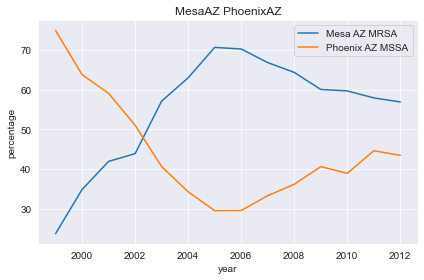

In [46]:
plotlinetmpMRSAMSSA_dual(mrsaregion='Mesa AZ',mssaregion='Phoenix AZ')

      year  percentage
0   1999.0   43.846154
1   2000.0   49.209694
2   2001.0   51.337507
3   2002.0   59.004559
4   2003.0   67.153938
5   2004.0   68.543640
6   2005.0   70.245678
7   2006.0   69.623781
8   2007.0   71.145525
9   2008.0   68.438305
10  2009.0   62.048986
11  2010.0   61.923664
12  2011.0   51.694352
13  2012.0   54.080000
      year  percentage
0   1999.0   52.183039
1   2000.0   52.636091
2   2001.0   46.408394
3   2002.0   43.956861
4   2003.0   41.113870
5   2004.0   39.154930
6   2005.0   40.844424
7   2006.0   41.945701
8   2007.0   42.351816
9   2008.0   42.126208
10  2009.0   46.562500
11  2010.0   45.248288
12  2011.0   48.925620
13  2012.0   48.209607


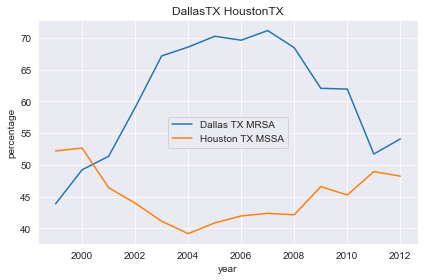

In [47]:
plotlinetmpMRSAMSSA_dual(mrsaregion='Dallas TX',mssaregion='Houston TX')

      year  percentage
0   1999.0   46.767422
1   2000.0   46.763823
2   2001.0   52.703793
3   2002.0   55.299368
4   2003.0   58.176658
5   2004.0   59.839034
6   2005.0   59.017898
7   2006.0   57.918552
8   2007.0   57.170172
9   2008.0   57.646390
10  2009.0   53.312500
11  2010.0   54.666096
12  2011.0   50.867769
13  2012.0   50.655022
      year  percentage
0   1999.0   53.979933
1   2000.0   49.157007
2   2001.0   48.207171
3   2002.0   40.349544
4   2003.0   32.488067
5   2004.0   31.021244
6   2005.0   28.252957
7   2006.0   28.982815
8   2007.0   28.148486
9   2008.0   30.110044
10  2009.0   35.765078
11  2010.0   36.519084
12  2011.0   48.106312
13  2012.0   45.280000


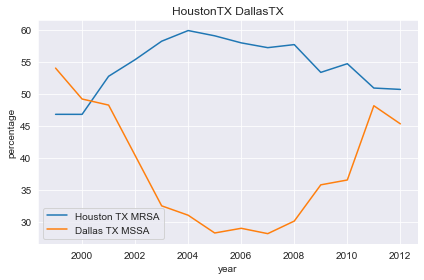

In [48]:
plotlinetmpMRSAMSSA_dual(mrsaregion='Houston TX',mssaregion='Dallas TX')

      year  percentage
0   1999.0   24.121853
1   2000.0   34.435942
2   2001.0   36.846154
3   2002.0   39.080460
4   2003.0   43.122250
5   2004.0   55.434158
6   2005.0   48.451730
7   2006.0   52.081697
8   2007.0   54.878049
9   2008.0   51.596091
10  2009.0   44.967682
11  2010.0   44.670051
12  2011.0   66.666667
      year  percentage
0   1999.0   53.979933
1   2000.0   49.157007
2   2001.0   48.207171
3   2002.0   40.349544
4   2003.0   32.488067
5   2004.0   31.021244
6   2005.0   28.252957
7   2006.0   28.982815
8   2007.0   28.148486
9   2008.0   30.110044
10  2009.0   35.765078
11  2010.0   36.519084
12  2011.0   48.106312
13  2012.0   45.280000


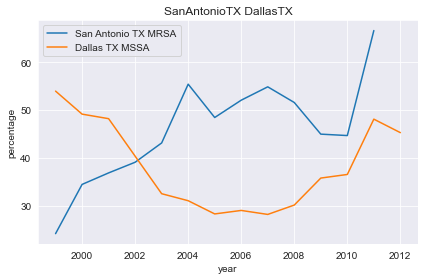

In [49]:
plotlinetmpMRSAMSSA_dual(mrsaregion='San Antonio TX',mssaregion='Dallas TX')

      year  percentage
0   1999.0   36.795252
1   2000.0   27.362708
2   2001.0   32.283858
3   2002.0   39.202581
4   2003.0   41.858464
5   2004.0   50.296581
6   2005.0   52.564895
7   2006.0   51.635585
8   2007.0   52.442641
9   2008.0   51.755433
10  2009.0   49.095607
11  2010.0   48.308166
12  2011.0   45.828949
13  2012.0   43.461372
     year  percentage
0  1999.0   61.795407
1  2000.0   54.235638
2  2001.0   49.666667
3  2002.0   48.905109
4  2003.0   44.097693
5  2004.0   47.626113
6  2005.0   40.753425


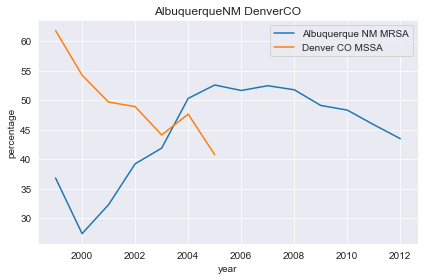

In [50]:
plotlinetmpMRSAMSSA_dual(mrsaregion='Albuquerque NM',mssaregion='Denver CO')

     year  percentage
0  1999.0   12.652068
1  2000.0   20.797721
2  2001.0   24.050633
3  2002.0   28.459530
     year  percentage
0  1999.0   61.795407
1  2000.0   54.235638
2  2001.0   49.666667
3  2002.0   48.905109
4  2003.0   44.097693
5  2004.0   47.626113
6  2005.0   40.753425


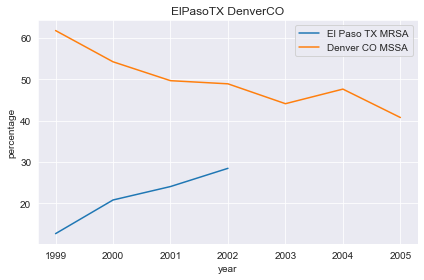

In [51]:
plotlinetmpMRSAMSSA_dual(mrsaregion='El Paso TX',mssaregion='Denver CO')

     year  percentage
0  1999.0   37.891441
1  2000.0   45.374878
2  2001.0   49.555556
3  2002.0   50.912409
4  2003.0   55.359566
5  2004.0   52.077151
6  2005.0   59.246575
     year  percentage
0  1999.0   86.861314
1  2000.0   74.928775
2  2001.0   74.894515
3  2002.0   67.362924


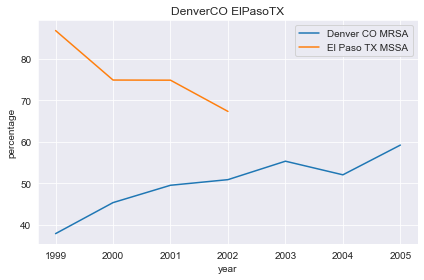

In [52]:
plotlinetmpMRSAMSSA_dual(mssaregion='El Paso TX',msaregion='Denver CO')

      year  percentage
0   1999.0   50.693569
1   2000.0   38.809858
2   2001.0   39.537734
3   2002.0   37.702790
4   2003.0   37.668758
5   2004.0   36.981215
6   2005.0   32.324182
7   2006.0   35.371011
8   2007.0   34.433962
9   2008.0   33.333333
10  2009.0   35.607094
     year  percentage
0  1999.0   48.743719
1  2000.0   57.347670
2  2001.0   60.501859
3  2002.0   60.097087
4  2003.0   54.838710
5  2004.0   57.967033
6  2005.0   49.752781
7  2006.0   50.803213


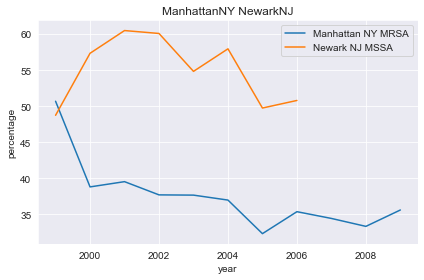

In [53]:
plotlinetmpMRSAMSSA_dual(mrsaregion='Manhattan NY',mssaregion='Newark NJ')

      year  percentage
0   1999.0   57.214429
1   2000.0   54.681648
2   2001.0   49.937733
3   2002.0   50.049456
4   2003.0   46.280992
5   2004.0   54.461182
6   2005.0   52.502910
7   2006.0   50.362694
8   2007.0   46.428571
9   2008.0   43.920145
10  2009.0   41.850990
11  2010.0   43.697479
12  2011.0   40.445127
13  2012.0   36.800000
      year  percentage
0   1999.0   49.306431
1   2000.0   60.709277
2   2001.0   60.007004
3   2002.0   61.794289
4   2003.0   61.874881
5   2004.0   58.693753
6   2005.0   50.282061
7   2006.0   47.981546
8   2007.0   46.104123
9   2008.0   46.899225
10  2009.0   47.135061


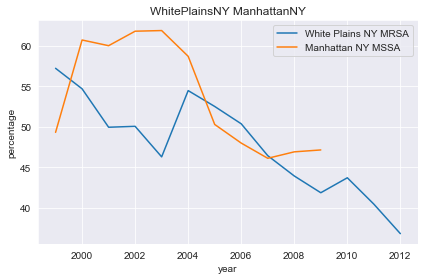

In [54]:
plotlinetmpMRSAMSSA_dual(mrsaregion='White Plains NY',mssaregion='Manhattan NY')